Learned parameters: [4.6389093 3.735874 ]


Text(0, 0.5, 'R-squared (R2)')

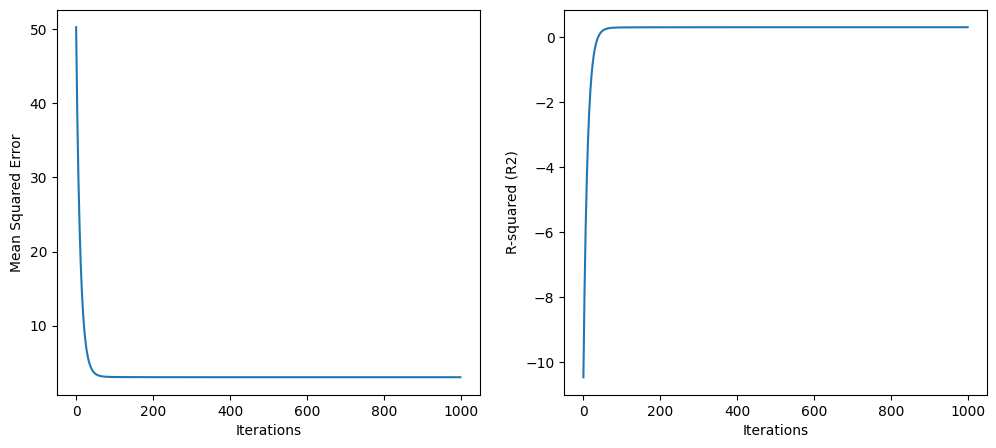

In [11]:
#Using plain gradient descent w. fixed learning rate and a no. of epochs for 
#automatic differentiation(JAX), OLS:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
learning_rate = 0.01
n_iterations = 1000

# Lists to store the MSE and R2 values
mse_list = []
r2_list = []

# Perform gradient descent
for iteration in range(n_iterations):
    y_pred = jnp.dot(X, params)
    error = y_pred - y
    
    # Compute the gradient using JAX automatic differentiation
    gradients = jax.grad(mean_squared_error_jax)(params, X, y)
    
    # Update theta element-wise
    params -= learning_rate * gradients

    # Calculate MSE and R2 during training
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    mse_list.append(mse)
    r2_list.append(r2)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the MSE and R2 values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(mse_list)
plt.xlabel('Iterations')
plt.ylabel('Mean Squared Error')
plt.subplot(1, 2, 2)
plt.plot(r2_list)
plt.xlabel('Iterations')
plt.ylabel('R-squared (R2)')

Learned parameters: [4.605599 3.702875]


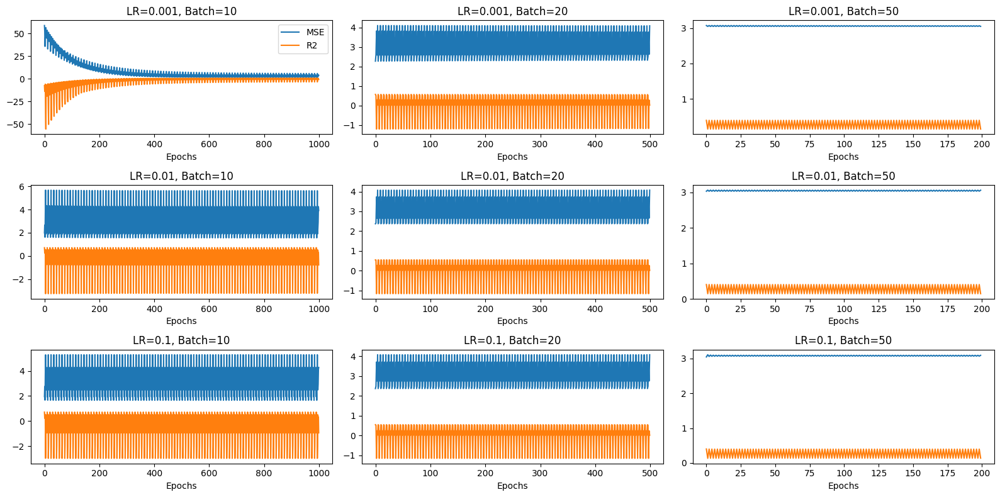

In [2]:
#Using stochastic gradient descent w. a number of learning rates and a no. of batches and epochs for 
#automatic differentiation(JAX), OLS:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rates = [0.001, 0.01, 0.1]
batch_sizes = [10, 20, 50]

# Lists to store the MSE and R2 values for different settings
results = {
    "learning_rates": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(mean_squared_error_jax)(params, X_batch, y_batch)

                # Update theta element-wise
                params -= learning_rate * gradients

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["learning_rates"].append(learning_rate)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the results for different settings
plt.figure(figsize=(16, 8))
for i in range(len(learning_rates)):
    for j in range(len(batch_sizes)):
        label = f"LR={learning_rates[i]}, Batch={batch_sizes[j]}"
        plt.subplot(len(learning_rates), len(batch_sizes), i * len(batch_sizes) + j + 1)
        plt.plot(results["mse_values"][i * len(batch_sizes) + j], label="MSE")
        plt.plot(results["r2_values"][i * len(batch_sizes) + j], label="R2")
        plt.xlabel('Epochs')  # Change 'Iterations' to 'Epochs'
        plt.title(label)
        if i == 0 and j == 0:
            plt.legend()

plt.tight_layout()
plt.show()

Theta from plain gradient descent:
[[0.42265003]
 [5.71994504]]


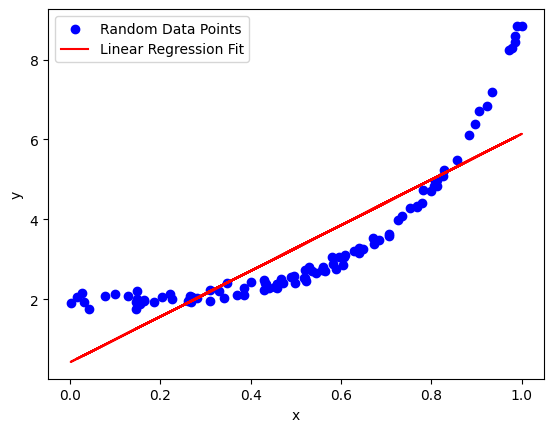

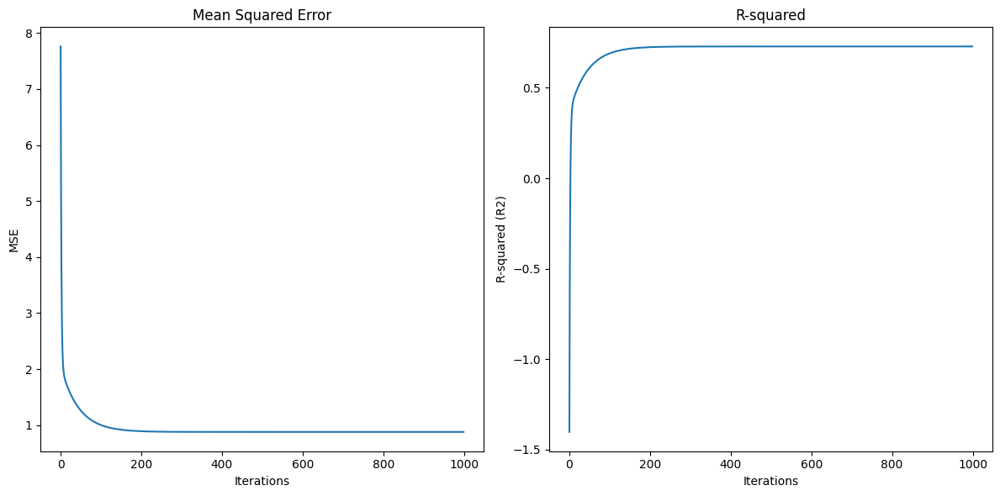

In [25]:
#Plain gradient descent, analytical gradients, fixed learning rate, OLS:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate random data
n = 100
x = np.random.rand(n, 1)
y = 2.0 + 5 * x**4 * x + x**3 + x**2 + 0.1 * np.random.randn(n, 1)

# Add a column of ones to the input data for the bias term
X = np.c_[np.ones((n, 1)), x]

# Define the learning rate and the number of iterations
learning_rate = 0.1
n_iterations = 1000

# Initialize random values for theta
theta = np.random.randn(2, 1)

# Create lists to store MSE and R-squared values during training
mse_list = []
r2_list = []

# Perform gradient descent with analytical gradients
for iteration in range(n_iterations):
    gradients = -2 / n * X.T @ (y - X @ theta)
    theta -= learning_rate * gradients

    # Calculate MSE and R2 during training
    y_pred = X.dot(theta)
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    mse_list.append(mse)
    r2_list.append(r2)

print("Theta from plain gradient descent:")
print(theta)

# Plot the data and the linear regression fit
plt.scatter(x, y, label='Random Data Points', color='blue')
plt.plot(x, X.dot(theta), color='red', label='Linear Regression Fit')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()

# Plot MSE and R2 over iterations
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(range(n_iterations), mse_list)
plt.xlabel('Iterations')
plt.ylabel('MSE')
plt.title('Mean Squared Error')

plt.subplot(1, 2, 2)
plt.plot(range(n_iterations), r2_list)
plt.xlabel('Iterations')
plt.ylabel('R-squared (R2)')
plt.title('R-squared')

plt.tight_layout()
plt.show()

Theta from Ridge regression (lambda = 0.0001):
[[0.34825024]
 [6.0132117 ]]
Theta from Ridge regression (lambda = 0.001):
[[0.38431743]
 [5.94446   ]]
Theta from Ridge regression (lambda = 0.01):
[[0.7042917]
 [5.3345213]]
Theta from Ridge regression (lambda = 0.1):
[[2.1215394]
 [2.6329513]]
Theta from Ridge regression (lambda = 1):
[[3.2750208 ]
 [0.43417192]]


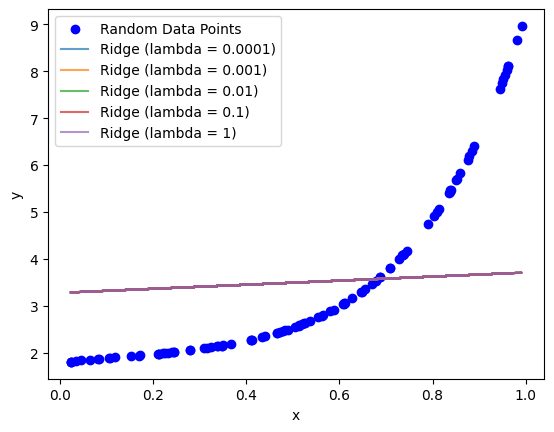

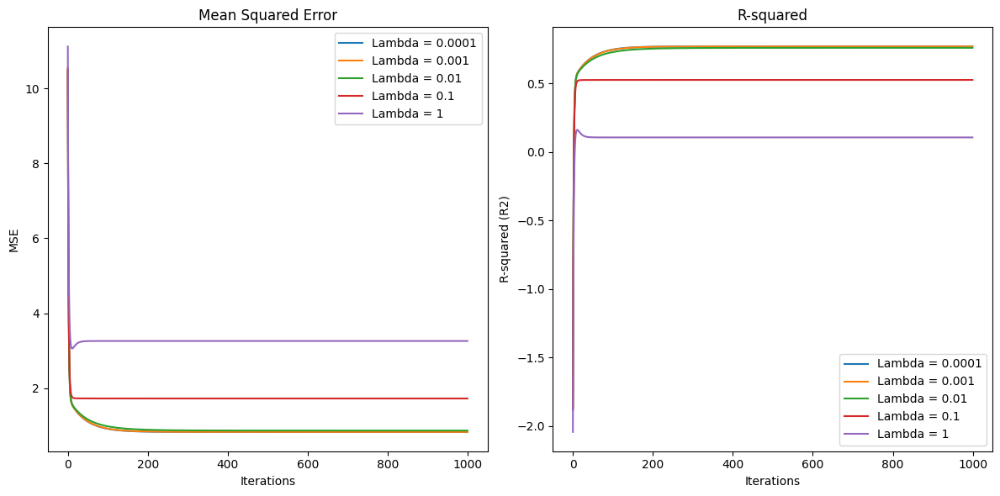

In [3]:
#Plain gradient descent, Ridge regression, using automatic differentiation(JAX), fixed learning rate:
import numpy as np
import matplotlib.pyplot as plt
import jax
from jax import grad, random
from sklearn.metrics import mean_squared_error, r2_score

# Generate random data
n = 100
key = jax.random.PRNGKey(0)  # Create a random key for random number generation
x = jax.random.uniform(key, (n, 1))
y = 2.0 + 5 * x**4 * x + x**3 + x**2 + 0.1 * jax.random.normal(key, (n, 1))

# Add a column of ones to the input data for the bias term
X = jnp.c_[jnp.ones((n, 1)), x]

# Define the number of iterations and learning rate
n_iterations = 1000
learning_rate = 0.1

# List of lambda values
lambda_values = [0.0001, 0.001, 0.01, 0.1, 1]

# Create lists to store MSE and R-squared values during training
mse_list = {lmbda: [] for lmbda in lambda_values}
r2_list = {lmbda: [] for lmbda in lambda_values}

for lmbda in lambda_values:
    # Initialize random values for theta from a normal distribution
    theta = jax.random.normal(key, (2, 1))

    # Define the Ridge loss function
    def ridge_loss(theta):
        y_pred = X.dot(theta)
        mse = jnp.mean((y - y_pred) ** 2)
        ridge_term = lmbda * jnp.sum(theta[1:] ** 2)  # Ridge regularization term
        return mse + ridge_term

    # Compute the gradient of the loss function using automatic differentiation
    gradient_fn = grad(ridge_loss)

    # Perform gradient descent with Ridge regularization
    for iteration in range(n_iterations):
        gradients = gradient_fn(theta)
        theta -= learning_rate * gradients

        # Calculate MSE and R2 during training
        y_pred = X.dot(theta)
        mse = mean_squared_error(y, y_pred)
        r2 = r2_score(y, y_pred)
        mse_list[lmbda].append(mse)
        r2_list[lmbda].append(r2)

    print(f"Theta from Ridge regression (lambda = {lmbda}):")
    print(theta)

# Rest of your code for plotting and visualization...

# Plot the data and the Ridge regression fits
plt.scatter(x, y, label='Random Data Points', color='blue')
for lmbda in lambda_values:
    plt.plot(x, X.dot(theta), label=f'Ridge (lambda = {lmbda})', alpha=0.7)

plt.xlabel('x')
plt.ylabel('y')
plt.legend()

# Plot MSE and R2 over iterations for different lambda values
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
for lmbda in lambda_values:
    plt.plot(range(n_iterations), mse_list[lmbda], label=f'Lambda = {lmbda}')
plt.xlabel('Iterations')
plt.ylabel('MSE')
plt.title('Mean Squared Error')
plt.legend()

plt.subplot(1, 2, 2)
for lmbda in lambda_values:
    plt.plot(range(n_iterations), r2_list[lmbda], label=f'Lambda = {lmbda}')
plt.xlabel('Iterations')
plt.ylabel('R-squared (R2)')
plt.title('R-squared')
plt.legend()

plt.tight_layout()
plt.show()

Theta from Ridge regression (lambda = 0.0001, batch_size = 16):
[[0.3496441]
 [6.0107126]]
Theta from Ridge regression (lambda = 0.001, batch_size = 16):
[[0.38557854]
 [5.9422016 ]]
Theta from Ridge regression (lambda = 0.01, batch_size = 16):
[[0.70475006]
 [5.333701  ]]
Theta from Ridge regression (lambda = 0.1, batch_size = 16):
[[2.121569 ]
 [2.6329052]]
Theta from Ridge regression (lambda = 1, batch_size = 16):
[[3.2750137 ]
 [0.43417528]]
Theta from Ridge regression (lambda = 0.0001, batch_size = 32):
[[0.40014517]
 [5.9202433 ]]
Theta from Ridge regression (lambda = 0.001, batch_size = 32):
[[0.4331546]
 [5.8570333]]
Theta from Ridge regression (lambda = 0.01, batch_size = 32):
[[0.73095584]
 [5.2871366 ]]
Theta from Ridge regression (lambda = 0.1, batch_size = 32):
[[2.121569 ]
 [2.6329052]]
Theta from Ridge regression (lambda = 1, batch_size = 32):
[[3.2750137 ]
 [0.43417528]]
Theta from Ridge regression (lambda = 0.0001, batch_size = 64):
[[0.925591 ]
 [4.9789195]]
Theta fro

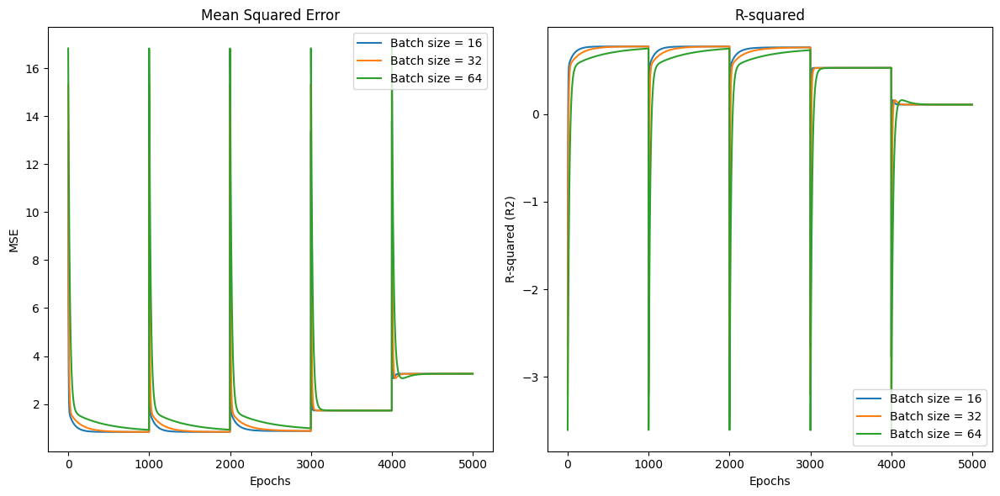

In [8]:
#Ridge regression, automatic differentiation (JAX) using a no. of epochs, fixed learning rate:
import numpy as np
import matplotlib.pyplot as plt
import jax
from jax import grad, random
from sklearn.metrics import mean_squared_error, r2_score

# Generate random data
n = 100
key = jax.random.PRNGKey(0)  # Create a random key for random number generation
x = jax.random.uniform(key, (n, 1))
y = 2.0 + 5 * x**4 * x + x**3 + x**2 + 0.1 * jax.random.normal(key, (n, 1))

# Add a column of ones to the input data for the bias term
X = jnp.c_[jnp.ones((n, 1)), x]

# Define the number of epochs (instead of iterations)
n_epochs = 1000

# List of lambda values
lambda_values = [0.0001, 0.001, 0.01, 0.1, 1]

# Lists of batch sizes and learning rates to explore
batch_sizes = [16, 32, 64]
learning_rate = 0.01  # Use a single learning rate

# Create lists to store MSE and R-squared values during training
mse_lists = {}  # Dictionary to store MSE for each batch size
r2_lists = {}   # Dictionary to store R2 for each batch size

for batch_size in batch_sizes:
    mse_list = []  # Store MSE for this batch size
    r2_list = []   # Store R2 for this batch size

    for lmbda in lambda_values:
        # Initialize random values for theta from a normal distribution
        theta = jax.random.normal(key, (2, 1))

        # Define the Ridge loss function
        def ridge_loss(theta):
            y_pred = X.dot(theta)
            mse = jnp.mean((y - y_pred) ** 2)
            ridge_term = lmbda * jnp.sum(theta[1:] ** 2)  # Ridge regularization term
            return mse + ridge_term

        # Compute the gradient of the loss function using automatic differentiation
        gradient_fn = grad(ridge_loss)

        # Perform gradient descent with Ridge regularization
        for epoch in range(n_epochs):
            # Divide data into batches
            num_batches = n // batch_size
            for batch in range(num_batches):
                batch_start = batch * batch_size
                batch_end = (batch + 1) * batch_size
                X_batch = X[batch_start:batch_end]
                y_batch = y[batch_start:batch_end]
                
                gradients = gradient_fn(theta)
                theta -= learning_rate * gradients

            # Calculate MSE and R2 during training
            y_pred = X.dot(theta)
            mse = mean_squared_error(y, y_pred)
            r2 = r2_score(y, y_pred)
            mse_list.append(mse)
            r2_list.append(r2)

        print(f"Theta from Ridge regression (lambda = {lmbda}, batch_size = {batch_size}):")
        print(theta)

    # Store the lists for this batch size
    mse_lists[batch_size] = mse_list
    r2_lists[batch_size] = r2_list

# Plot MSE and R2 for different batch sizes and epochs
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
for batch_size in batch_sizes:
    plt.plot(range(n_epochs * len(lambda_values)), mse_lists[batch_size],
             label=f'Batch size = {batch_size}')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.title('Mean Squared Error')
plt.legend()

plt.subplot(1, 2, 2)
for batch_size in batch_sizes:
    plt.plot(range(n_epochs * len(lambda_values)), r2_lists[batch_size],
             label=f'Batch size = {batch_size}')
plt.xlabel('Epochs')
plt.ylabel('R-squared (R2)')
plt.title('R-squared')
plt.legend()

plt.tight_layout()
plt.show()

Learned parameters: [4.639301  3.7354655]


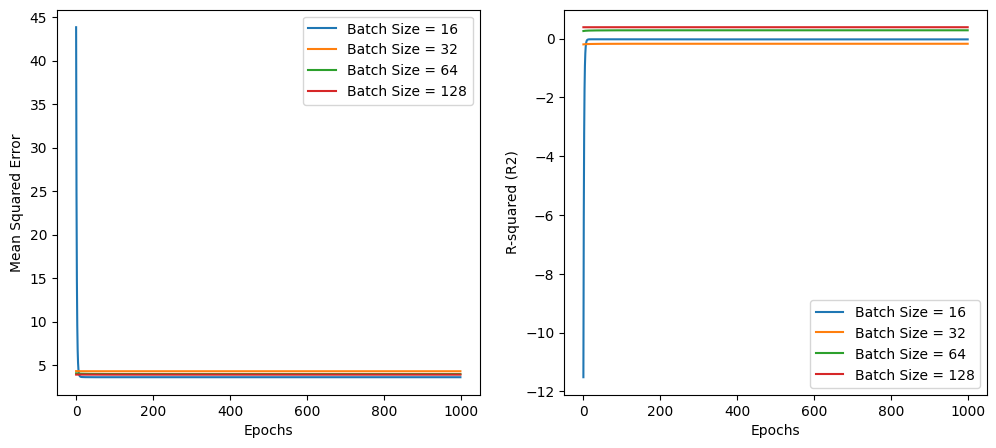

In [7]:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
learning_rate = 0.01
n_iterations = 1000
batch_sizes = [16, 32, 64, 128]  # Range of batch sizes to explore

# Lists to store the MSE and R2 values for each batch size
mse_lists = {}
r2_lists = {}

# Perform gradient descent with different batch sizes
for batch_size in batch_sizes:
    mse_list = []
    r2_list = []

    for epoch in range(n_iterations):
        mse_epoch = 0.0
        r2_epoch = 0.0

        for batch_start in range(0, len(X), batch_size):
            batch_end = batch_start + batch_size
            X_batch = X[batch_start:batch_end]
            y_batch = y[batch_start:batch_end]

            y_pred = jnp.dot(X_batch, params)
            error = y_pred - y_batch

            # Compute the gradient using JAX automatic differentiation
            gradients = jax.grad(mean_squared_error_jax)(params, X_batch, y_batch)

            # Update theta element-wise
            params -= learning_rate * gradients

            mse = mean_squared_error(y_batch, y_pred)
            r2 = r2_score(y_batch, y_pred)

            mse_epoch += mse
            r2_epoch += r2

        # Calculate the average MSE and R2 for the epoch
        mse_epoch /= (len(X) / batch_size)
        r2_epoch /= (len(X) / batch_size)

        mse_list.append(mse_epoch)
        r2_list.append(r2_epoch)

    mse_lists[batch_size] = mse_list
    r2_lists[batch_size] = r2_list

# Print the learned parameters
print("Learned parameters:", params)

# Plot the MSE and R2 values for each batch size
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
for batch_size in batch_sizes:
    plt.plot(mse_lists[batch_size], label=f'Batch Size = {batch_size}')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.legend()

plt.subplot(1, 2, 2)
for batch_size in batch_sizes:
    plt.plot(r2_lists[batch_size], label=f'Batch Size = {batch_size}')
plt.xlabel('Epochs')
plt.ylabel('R-squared (R2)')
plt.legend()

plt.show()

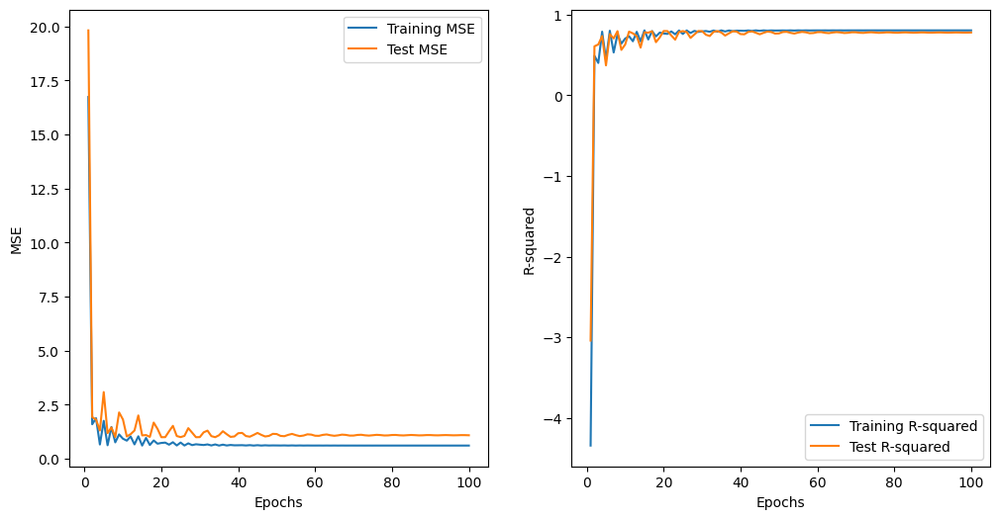

Final learned parameters: [[3.49684816]
 [1.5929205 ]]
Training MSE: 0.6134329142353614
Test MSE: 1.0900159916778518
Training R-squared: 0.8041311579533731
Test R-squared: 0.7776757532096079


In [14]:
#Analytical gradients with momentum, plain gradient descent, fixed learning rate, and a no. of epochs:

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Generate random data for x and y
x = np.random.rand(100, 1)
y = 2.0 + 5 * x**4 * x + x**3 + x**2 + 0.1 * np.random.randn(100, 1)

# Split the data into training and test sets (80% training, 20% testing)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Scale the data using StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Initialize random values for theta
theta = np.random.randn(2, 1)  # Initialize with 2 parameters (intercept and slope)

# Define the learning rate, momentum term, and number of epochs
learning_rate = 0.01
momentum = 0.9
n_epochs = 100  # Number of epochs

# Initialize lists to store MSE and R-squared values
mse_train_list = []
mse_test_list = []
r2_train_list = []
r2_test_list = []

# Initialize the momentum term
v = np.zeros_like(theta)

for epoch in range(n_epochs):
    # Calculate predictions
    y_train_pred = x_train_scaled.dot(theta[1:]) + theta[0]
    y_test_pred = x_test_scaled.dot(theta[1:]) + theta[0]
    
    # Calculate the gradients
    gradients = -2 * x_train_scaled.T @ (y_train - y_train_pred)
    
    # Update the momentum term with the gradients
    v = momentum * v + learning_rate * gradients
    
    # Update the parameters with momentum
    theta[1:] -= v[1:]
    theta[0] -= learning_rate * np.sum(y_train_pred - y_train)

    mse_train = mean_squared_error(y_train, y_train_pred)
    mse_test = mean_squared_error(y_test, y_test_pred)
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    mse_train_list.append(mse_train)
    mse_test_list.append(mse_test)
    r2_train_list.append(r2_train)
    r2_test_list.append(r2_test)

# Plot MSE and R-squared values as functions of epochs
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(range(1, n_epochs + 1), mse_train_list, label='Training MSE')
plt.plot(range(1, n_epochs + 1), mse_test_list, label='Test MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(range(1, n_epochs + 1), r2_train_list, label='Training R-squared')
plt.plot(range(1, n_epochs + 1), r2_test_list, label='Test R-squared')
plt.xlabel('Epochs')
plt.ylabel('R-squared')
plt.legend()

plt.show()

print("Final learned parameters:", theta)
print("Training MSE:", mse_train)
print("Test MSE:", mse_test)
print("Training R-squared:", r2_train)
print("Test R-squared:", r2_test)

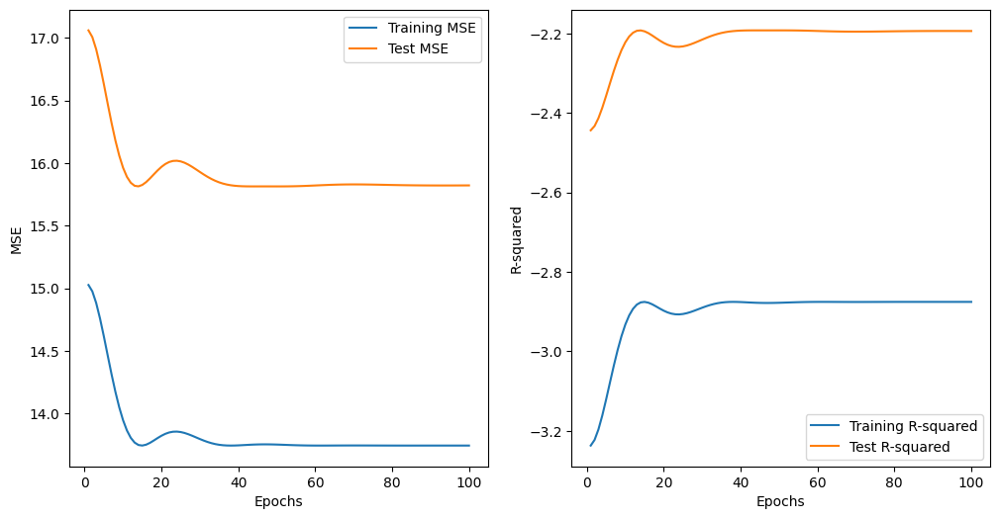

Final learned parameters: [[1.6781034]]
Training MSE: 13.743544983621058
Test MSE: 15.821395498716797
Training R-squared: -2.8753300732066602
Test R-squared: -2.1936272825434076


In [30]:
#Plain gradient descent with momentum, 
#using JAX automatic differentiation w. fixed learning rate, and a no. of epochs(OLS):
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import jax
import jax.numpy as jnp

def linear_regression(params, x):
    return jnp.dot(x, params)

def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Generate random data for x and y
x = np.random.rand(100, 1)
y = 2.0 + 5 * x**4 * x + x**3 + x**2 + 0.1 * np.random.randn(100, 1)

# Split the data into training and test sets (80% training, 20% testing)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Scale the data using StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Initialize random values for theta
theta = jnp.array(np.random.randn(x_train_scaled.shape[1], 1), dtype=jnp.float32)  # Initialize with parameters

# Define the learning rate, momentum term, and number of epochs
learning_rate = 0.01
momentum = 0.9
n_epochs = 100  # Number of epochs

# Initialize lists to store MSE and R-squared values
mse_train_list = []
mse_test_list = []
r2_train_list = []
r2_test_list = []

# Initialize the momentum term
v = jnp.zeros_like(theta)

for epoch in range(n_epochs):
    # Calculate predictions
    y_train_pred = linear_regression(theta, x_train_scaled)
    y_test_pred = linear_regression(theta, x_test_scaled)

    # Calculate the gradients using JAX automatic differentiation
    gradients = jax.grad(mean_squared_error_jax)(theta, x_train_scaled, y_train)

    # Update the momentum term with the gradients
    v = momentum * v + learning_rate * gradients

    # Update the parameters with momentum
    theta = theta - v

    mse_train = mean_squared_error(y_train, y_train_pred)
    mse_test = mean_squared_error(y_test, y_test_pred)
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    mse_train_list.append(mse_train)
    mse_test_list.append(mse_test)
    r2_train_list.append(r2_train)
    r2_test_list.append(r2_test)

# Plot MSE and R-squared values as functions of epochs
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(range(1, n_epochs + 1), mse_train_list, label='Training MSE')
plt.plot(range(1, n_epochs + 1), mse_test_list, label='Test MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(range(1, n_epochs + 1), r2_train_list, label='Training R-squared')
plt.plot(range(1, n_epochs + 1), r2_test_list, label='Test R-squared')
plt.xlabel('Epochs')
plt.ylabel('R-squared')
plt.legend()

plt.show()

print("Final learned parameters:", theta)
print("Training MSE:", mse_train)
print("Test MSE:", mse_test)
print("Training R-squared:", r2_train)
print("Test R-squared:", r2_test)

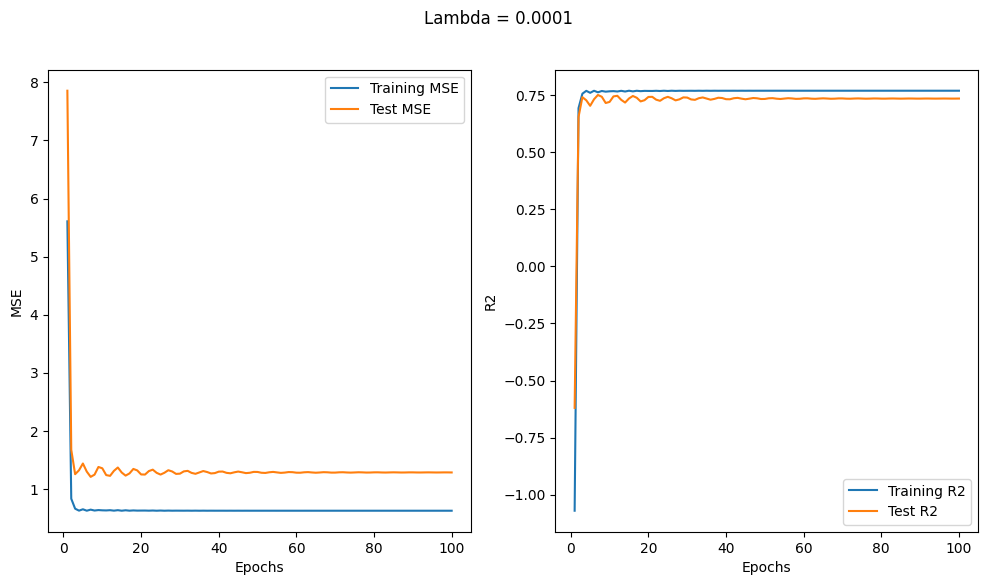

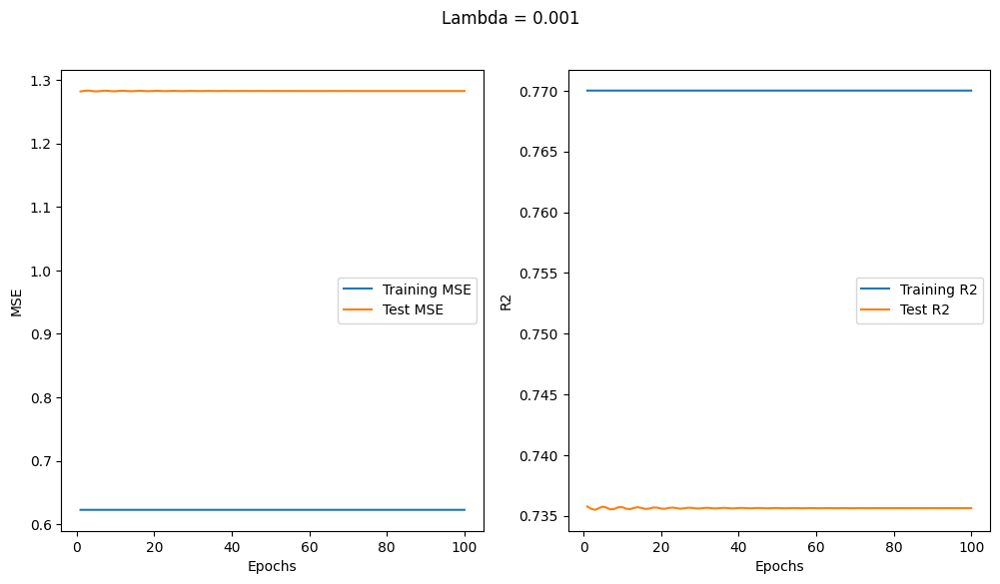

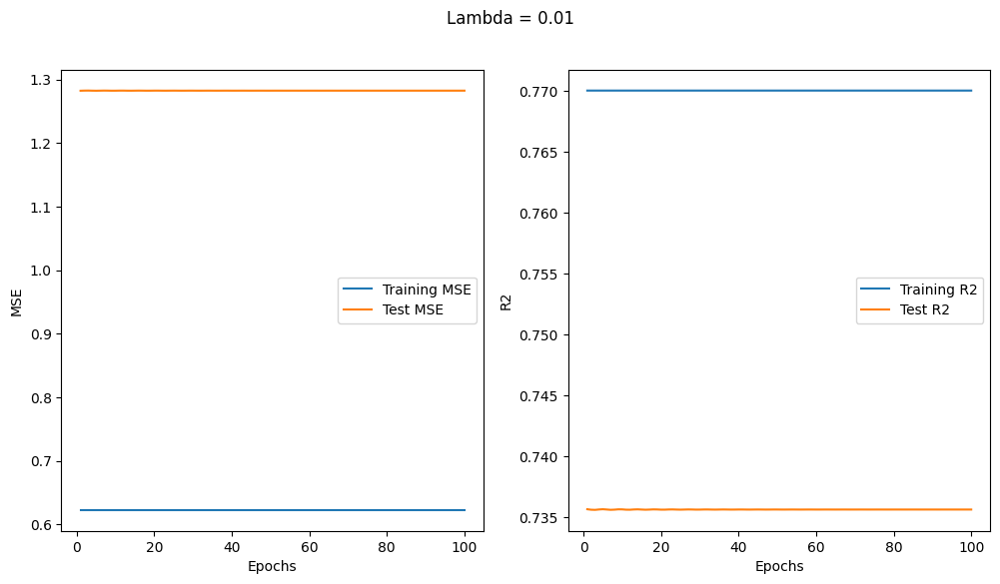

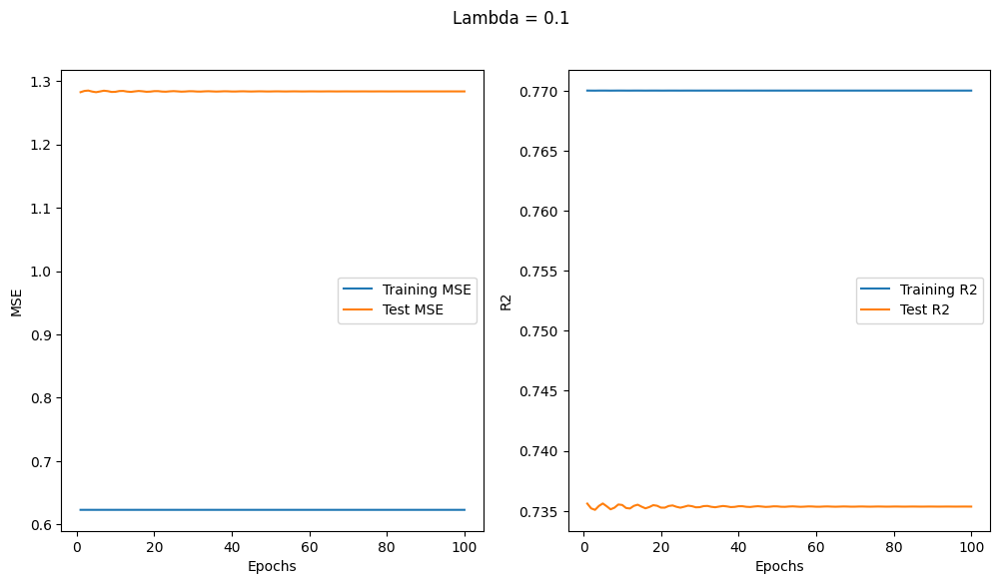

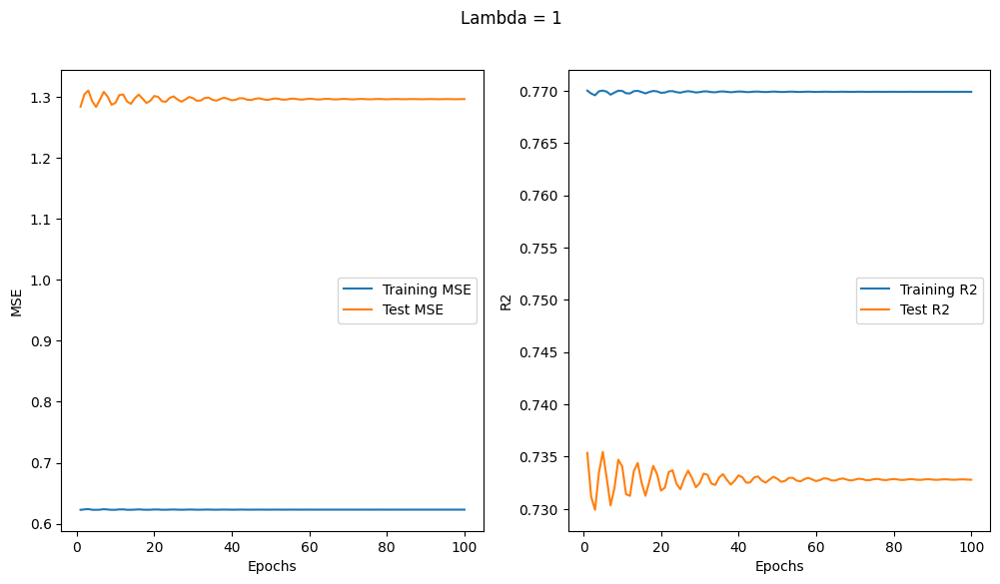

In [34]:
#Analytical gradients with momentum, fixed learning rate, and a no. of epochs, using
#Ridge regression:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Generate random data for x and y
x = np.random.rand(100, 1)
y = 2.0 + 5 * x**4 * x + x**3 + x**2 + 0.1 * np.random.randn(100, 1)

# Split the data into training and test sets (80% training, 20% testing)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Scale the data using StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Initialize random values for theta
theta = np.random.randn(2, 1)  # Initialize with 2 parameters (intercept and slope)

# Define the learning rate, momentum term, and number of epochs
learning_rate = 0.01
momentum = 0.9
n_epochs = 100  # Number of epochs

# Initialize the momentum term
v = np.zeros_like(theta)

# Define lambda values
lambda_values = [0.0001, 0.001, 0.01, 0.1, 1]

# Create arrays to store results for different lambda values
results = {
    "lambda_values": lambda_values,
    "epochs": list(range(n_epochs)),
    "mse_train": [],
    "mse_test": [],
    "r2_train": [],
    "r2_test": [],
}

for lambda_value in lambda_values:
    mse_train_list = []  # Reset the lists for each lambda value
    mse_test_list = []
    r2_train_list = []
    r2_test_list = []

    for epoch in range(n_epochs):
        # Calculate predictions
        y_train_pred = x_train_scaled.dot(theta[1:]) + theta[0]
        y_test_pred = x_test_scaled.dot(theta[1:]) + theta[0]

        # Calculate the gradients with Ridge regression
        gradients = -2 * x_train_scaled.T @ (y_train - y_train_pred) + 2 * lambda_value * theta

        # Update the momentum term with the gradients
        v = momentum * v + learning_rate * gradients

        # Update the parameters with momentum
        theta[1:] -= v[1:]
        theta[0] -= learning_rate * np.sum(y_train_pred - y_train)

        mse_train = mean_squared_error(y_train, y_train_pred)
        mse_test = mean_squared_error(y_test, y_test_pred)
        r2_train = r2_score(y_train, y_train_pred)
        r2_test = r2_score(y_test, y_test_pred)

        mse_train_list.append(mse_train)
        mse_test_list.append(mse_test)
        r2_train_list.append(r2_train)
        r2_test_list.append(r2_test)

    # Store results for the current lambda value
    results["mse_train"].append(mse_train_list.copy())
    results["mse_test"].append(mse_test_list.copy())
    results["r2_train"].append(r2_train_list.copy())
    results["r2_test"].append(r2_test_list.copy())

# Plot results
for i, lambda_value in enumerate(lambda_values):
    plt.figure(figsize=(12, 6))
    plt.suptitle(f"Lambda = {lambda_value}")

    plt.subplot(1, 2, 1)
    plt.plot(range(1, n_epochs + 1), results["mse_train"][i], label='Training MSE')
    plt.plot(range(1, n_epochs + 1), results["mse_test"][i], label='Test MSE')
    plt.xlabel('Epochs')
    plt.ylabel('MSE')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(range(1, n_epochs + 1), results["r2_train"][i], label='Training R2')
    plt.plot(range(1, n_epochs + 1), results["r2_test"][i], label='Test R2')
    plt.xlabel('Epochs')
    plt.ylabel('R2')
    plt.legend()

plt.show()

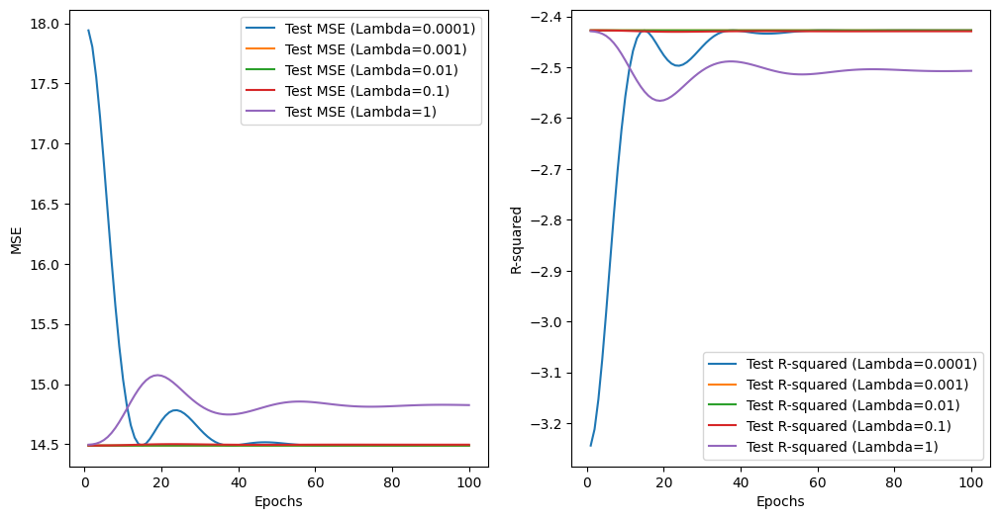

Final learned parameters: [[1.1340472]]


In [41]:
#Plain gradient descent with momentum, Ridge, fixed learning rate, using JAX.
#Changing OLS to Ridge in this context, means adding the regularization term to the Cost function,
#now the Cost function contains both the Loss function and the regularization. Clarification:
#The loss function measures the error for a single data point, and its purpose is to quantify how well the model's prediction matches the true target value for that specific data point. The loss function typically does not include regularization terms.
#The cost function (or sometimes referred to as the objective function) is the average of the loss function over the entire dataset, often including regularization terms. The cost function provides a global measure of how well the model is performing on the entire dataset. When you're training a model, the optimization algorithm minimizes the cost function to learn the model parameters.
#To clarify, regularization terms are typically added to the cost function, which is what's optimized during training. The cost function includes both the data loss (measured by the loss function) and the regularization term.
:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import jax
import jax.numpy as jnp

def linear_regression(params, x):
    return jnp.dot(x, params)

def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

def ridge_loss(params, x, y, lambda_value):
    mse = mean_squared_error_jax(params, x, y)
    ridge_term = 0.5 * lambda_value * jnp.sum(params**2)  # Ridge regularization term
    return mse + ridge_term

# Generate random data for x and y
x = np.random.rand(100, 1)
y = 2.0 + 5 * x**4 * x + x**3 + x**2 + 0.1 * np.random.randn(100, 1)

# Split the data into training and test sets (80% training, 20% testing)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Scale the data using StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Initialize random values for theta
theta = jnp.array(np.random.randn(x_train_scaled.shape[1], 1), dtype=jnp.float32)  # Initialize with parameters

# Define the learning rate, momentum term, and number of epochs
learning_rate = 0.01
momentum = 0.9
n_epochs = 100  # Number of epochs

# Ridge regularization parameters
lambda_values = [0.0001, 0.001, 0.01, 0.1, 1]

# Initialize lists to store MSE and R-squared values for each lambda
results = {"mse_test": [], "r2_test": []}

for lambda_value in lambda_values:
    # Initialize the momentum term
    v = jnp.zeros_like(theta)

    mse_test_list = []
    r2_test_list = []

    for epoch in range(n_epochs):
        # Calculate predictions
        y_test_pred = linear_regression(theta, x_test_scaled)

        # Calculate the gradients using JAX automatic differentiation
        gradients = jax.grad(ridge_loss)(theta, x_train_scaled, y_train, lambda_value)

        # Update the momentum term with the gradients
        v = momentum * v + learning_rate * gradients

        # Update the parameters with momentum
        theta = theta - v

        mse_test = mean_squared_error(y_test, y_test_pred)
        r2_test = r2_score(y_test, y_test_pred)

        mse_test_list.append(mse_test)
        r2_test_list.append(r2_test)

    results["mse_test"].append(mse_test_list)
    results["r2_test"].append(r2_test_list)

# Plot MSE and R-squared values as functions of epochs for each lambda
plt.figure(figsize=(12, 6))
for i, lambda_value in enumerate(lambda_values):
    plt.subplot(1, 2, 1)
    plt.plot(range(1, n_epochs + 1), results["mse_test"][i], label=f'Test MSE (Lambda={lambda_value})')

    plt.subplot(1, 2, 2)
    plt.plot(range(1, n_epochs + 1), results["r2_test"][i], label=f'Test R-squared (Lambda={lambda_value})')

plt.subplot(1, 2, 1)
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()

plt.subplot(1, 2, 2)
plt.xlabel('Epochs')
plt.ylabel('R-squared')
plt.legend()

plt.show()

print("Final learned parameters:", theta)

C:\Users\Kjæreng\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
C:\Users\Kjæreng\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\Kjæreng\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
C:\Users\Kjæreng\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\Kjæreng\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: overflow encountered in reduce


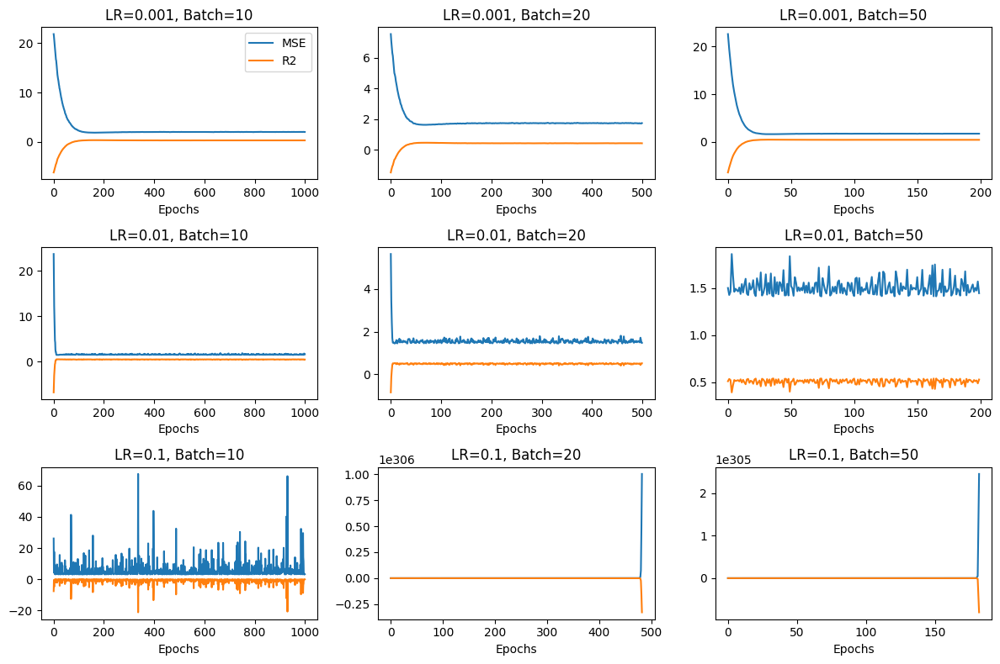

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate random data for x and y
np.random.seed(0)
x = np.random.rand(100, 1)
y = 2.0 + 5 * x**4 * x + x**3 + x**2 + 0.1 * np.random.randn(100, 1)

# Learning rates and batch sizes
learning_rates = [0.001, 0.01, 0.1]
batch_sizes = [10, 20, 50]
n_epochs = 100

# Lists to store the results
results = {
    "learning_rate": [],
    "batch_size": [],
    "mse_values": [],
    "r2_values": []
}

for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        mse_list = []
        r2_list = []

        theta = np.random.randn(2, 1)  # Initialize parameters

        m = len(x)
        n_batches = m // batch_size

        for epoch in range(n_epochs):
            shuffled_indices = np.random.permutation(m)
            x_shuffled = x[shuffled_indices]
            y_shuffled = y[shuffled_indices]

            for i in range(n_batches):
                start_idx = i * batch_size
                end_idx = (i + 1) * batch_size
                xi = x_shuffled[start_idx:end_idx]
                yi = y_shuffled[start_idx:end_idx]

                y_pred = xi.dot(theta[1:]) + theta[0]
                gradients = -2 * xi.T @ (yi - y_pred)
                theta -= learning_rate * gradients

                y_pred = x.dot(theta[1:]) + theta[0]
                mse = mean_squared_error(y, y_pred)
                r2 = r2_score(y, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["learning_rate"].append(learning_rate)
        results["batch_size"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Plot the results
plt.figure(figsize=(12, 8))

for i, learning_rate in enumerate(learning_rates):
    for j, batch_size in enumerate(batch_sizes):
        label = f"LR={learning_rate}, Batch={batch_size}"
        mse_values = results["mse_values"][i * len(batch_sizes) + j]
        r2_values = results["r2_values"][i * len(batch_sizes) + j]

        plt.subplot(len(learning_rates), len(batch_sizes), i * len(batch_sizes) + j + 1)
        plt.plot(range(len(mse_values)), mse_values, label='MSE')
        plt.plot(range(len(r2_values)), r2_values, label='R2')
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0 and j == 0:
            plt.legend()

plt.tight_layout()
plt.show()

Learned parameters: [3.0792744 2.779643 ]


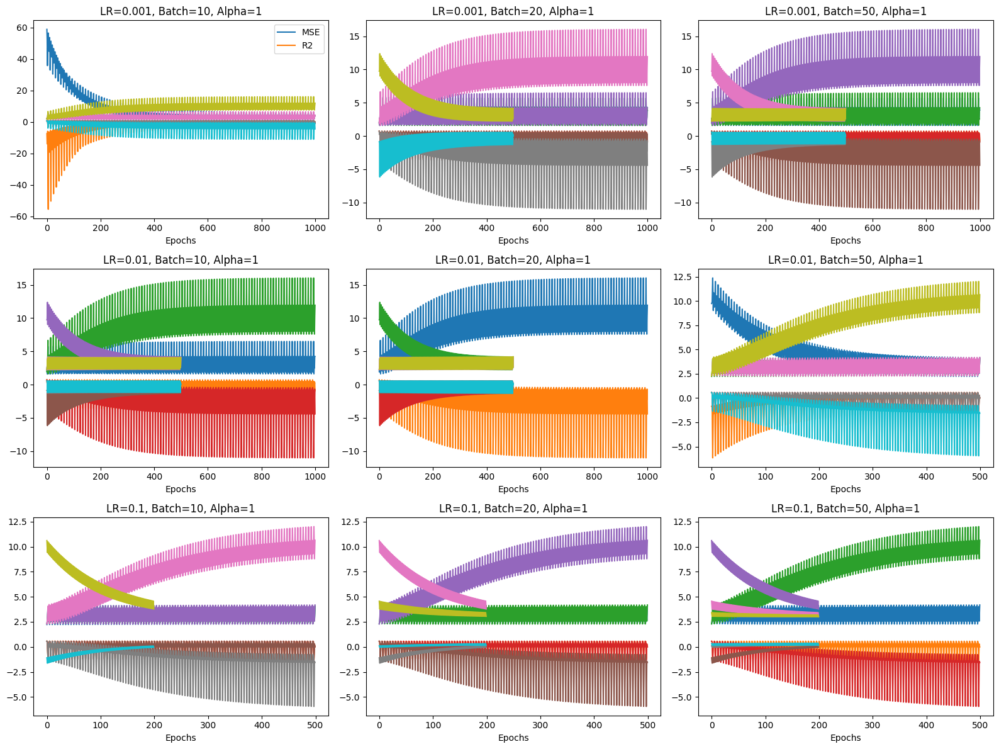

In [11]:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y, alpha):
    predictions = linear_regression(params, x)
    mse = jnp.mean((predictions - y) ** 2)
    penalty = alpha * jnp.sum(params**2)  # L2 regularization
    return mse + penalty

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rates = [0.001, 0.01, 0.1]
batch_sizes = [10, 20, 50]
alphas = [0.0001, 0.001, 0.01, 0.1, 1]  # Lambda values

# Lists to store the MSE and R2 values for different settings
results = {
    "learning_rates": [],
    "batch_sizes": [],
    "alphas": [],
    "mse_values": [],
    "r2_values": []
}

for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        for alpha in alphas:
            # Lists to store the MSE and R2 values
            mse_list = []
            r2_list = []

            for epoch in range(n_epochs):
                n_iterations = len(X) // batch_size
                for iteration in range(n_iterations):
                    # Create minibatches
                    start_idx = iteration * batch_size
                    end_idx = (iteration + 1) * batch_size
                    X_batch = X[start_idx:end_idx]
                    y_batch = y[start_idx:end_idx]

                    y_pred = jnp.dot(X_batch, params)
                    error = y_pred - y_batch

                    # Compute the gradient using JAX automatic differentiation
                    gradients = jax.grad(lambda params: mean_squared_error_jax(params, X_batch, y_batch, alpha))(params)

                    # Update theta element-wise
                    params -= learning_rate * gradients

                    # Calculate MSE and R2 during training
                    mse = mean_squared_error(y_batch, y_pred)
                    r2 = r2_score(y_batch, y_pred)
                    mse_list.append(mse)
                    r2_list.append(r2)

            results["learning_rates"].append(learning_rate)
            results["batch_sizes"].append(batch_size)
            results["alphas"].append(alpha)
            results["mse_values"].append(mse_list)
            results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the results for different settings
plt.figure(figsize=(16, 12))
for i, learning_rate in enumerate(learning_rates):
    for j, batch_size in enumerate(batch_sizes):
        for k, alpha in enumerate(alphas):
            label = f"LR={learning_rate}, Batch={batch_size}, Alpha={alpha}"
            plt.subplot(len(learning_rates), len(batch_sizes), i * len(batch_sizes) + j + 1)
            plt.plot(results["mse_values"][i * len(batch_sizes) + j + k], label="MSE")
            plt.plot(results["r2_values"][i * len(batch_sizes) + j + k], label="R2")
            plt.xlabel('Epochs')
            plt.title(label)
            if i == 0 and j == 0 and k == 0:
                plt.legend()

plt.tight_layout()
plt.show()

Learned parameters: [3.0858715 2.763015 ]


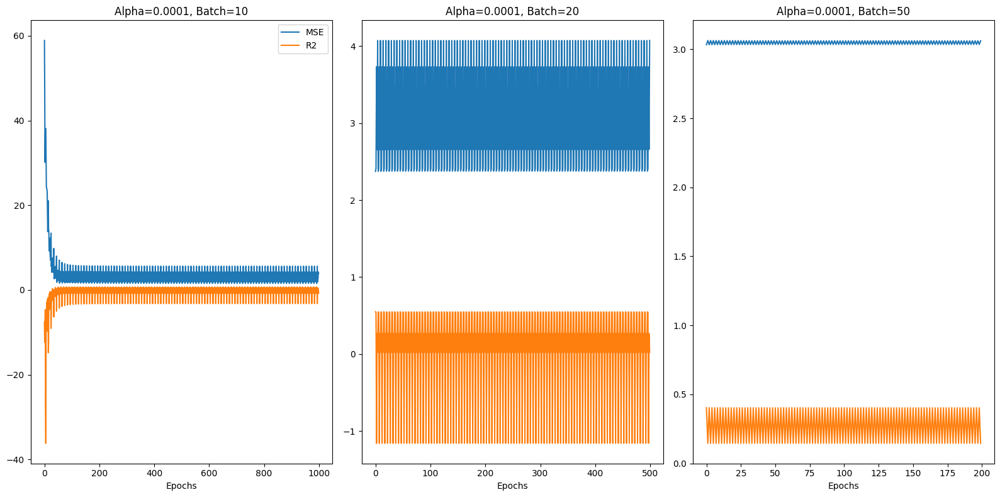

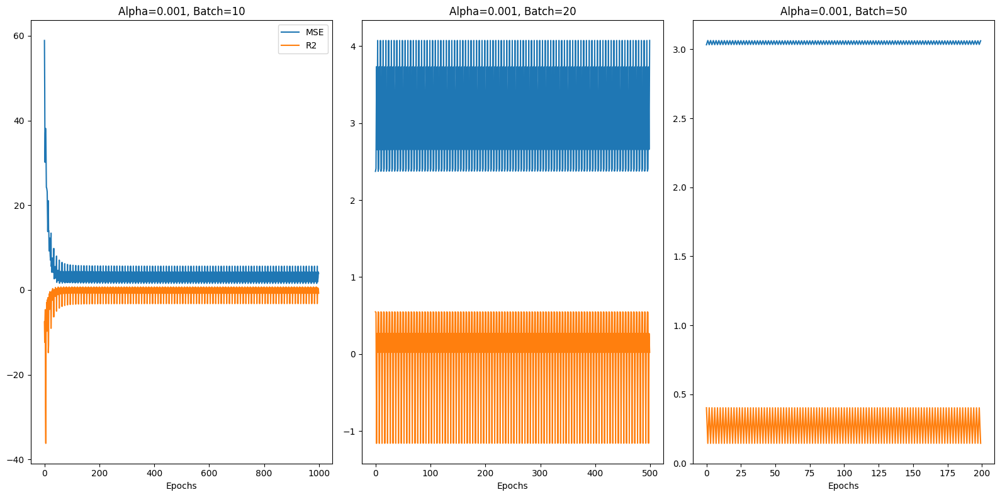

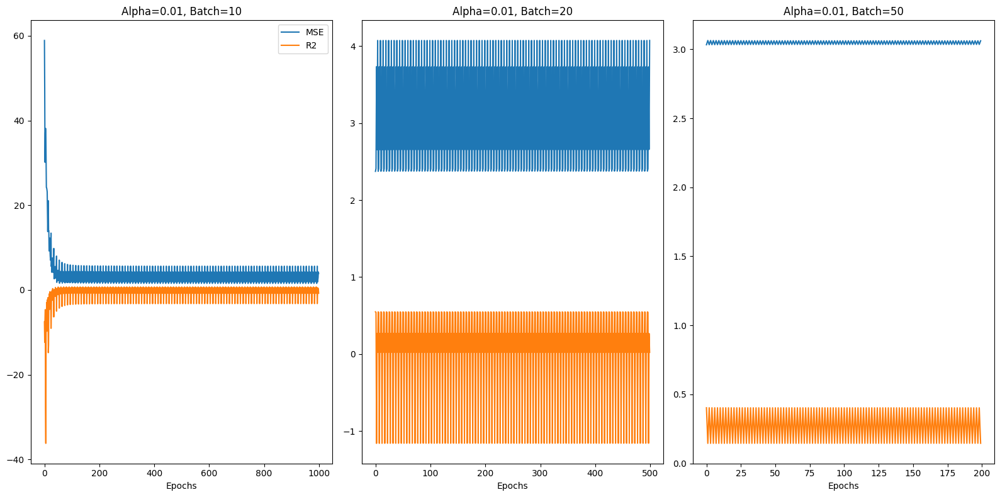

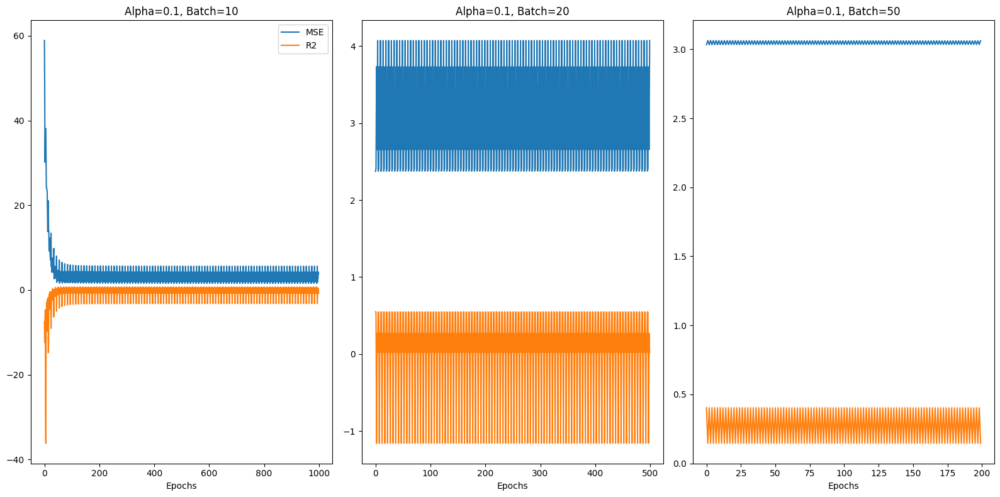

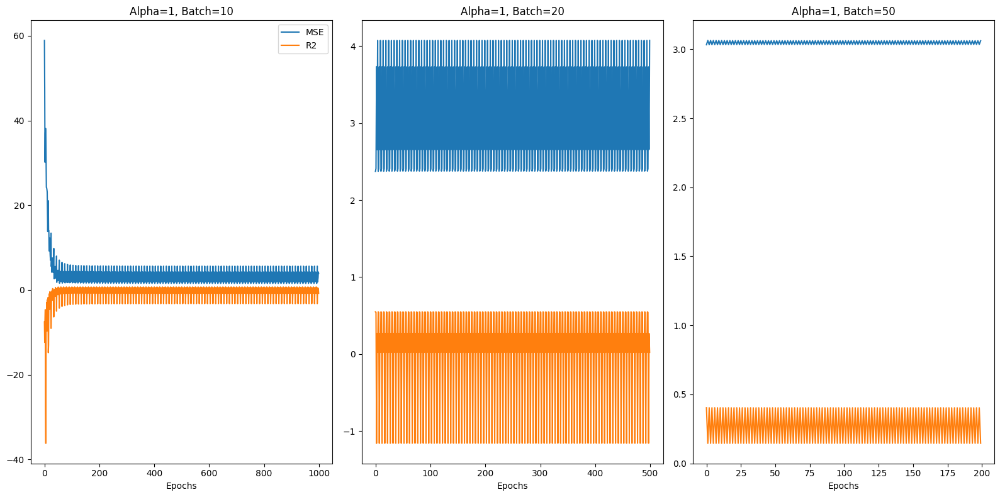

In [13]:
#SGD without momentum, automatic differentiation, over a range of learning rates, epochs=100 and 
#different batch sizes, Ridge regression:

import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error with L2 regularization)
def mean_squared_error_jax(params, x, y, alpha):
    predictions = linear_regression(params, x)
    mse = jnp.mean((predictions - y) ** 2)
    penalty = alpha * jnp.sum(params**2)  # L2 regularization
    return mse + penalty

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rate = 0.01  # Fixed learning rate
batch_sizes = [10, 20, 50]  # Batch sizes
alphas = [0.0001, 0.001, 0.01, 0.1, 1]  # Lambda values

# Lists to store the MSE and R2 values for different settings
results = {
    "alphas": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for alpha in alphas:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(lambda params: mean_squared_error_jax(params, X_batch, y_batch, alpha))(params)

                # Update theta element-wise
                params -= learning_rate * gradients

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["alphas"].append(alpha)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Create plots for different alpha and batch size values
for alpha in alphas:
    plt.figure(figsize=(16, 8))
    for batch_size in batch_sizes:
        i = batch_sizes.index(batch_size)
        label = f"Alpha={alpha}, Batch={batch_size}"
        plt.subplot(1, len(batch_sizes), i + 1)
        plt.plot(results["mse_values"][i], label="MSE")
        plt.plot(results["r2_values"][i], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0:
            plt.legend()
    plt.tight_layout()
    plt.show()

Learned parameters: [3.08587111 2.7630152 ]


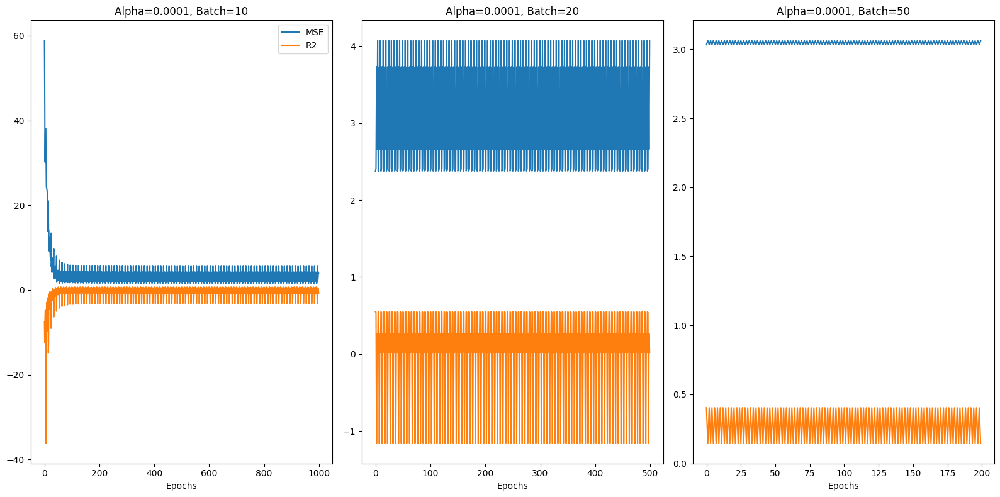

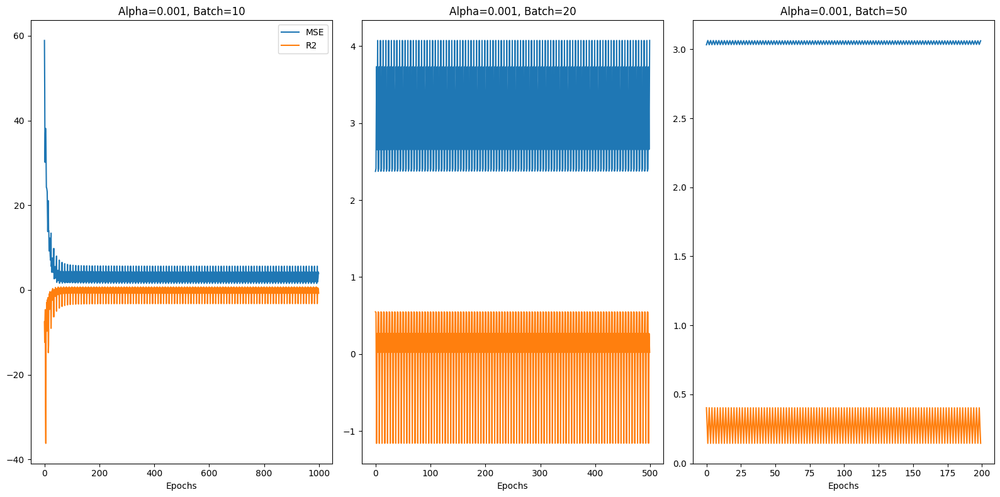

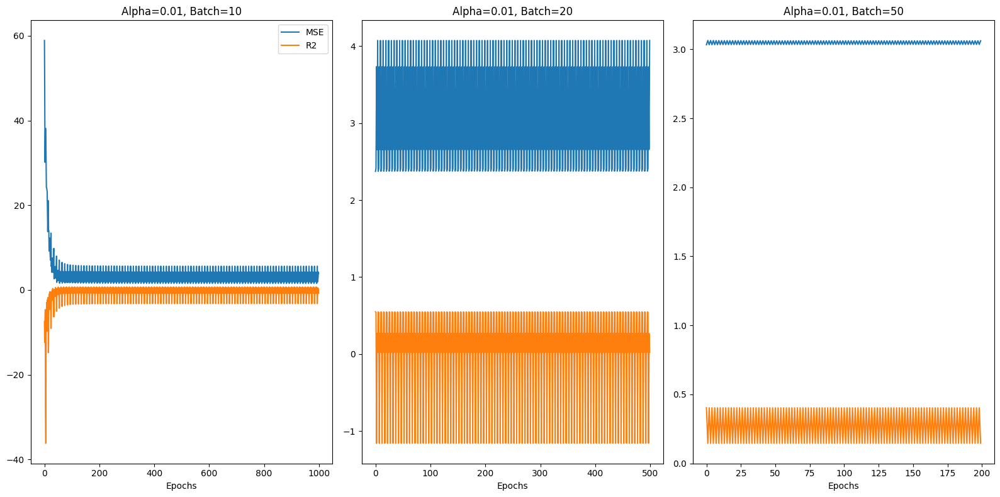

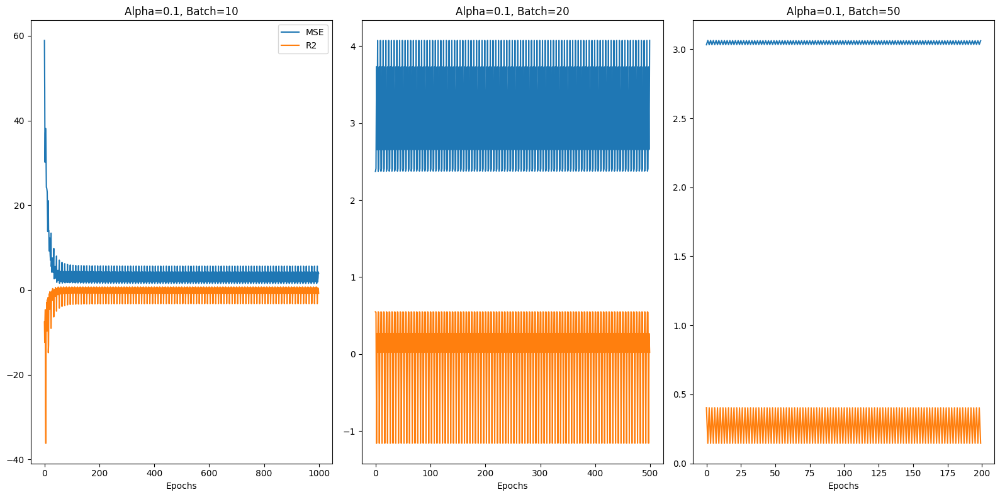

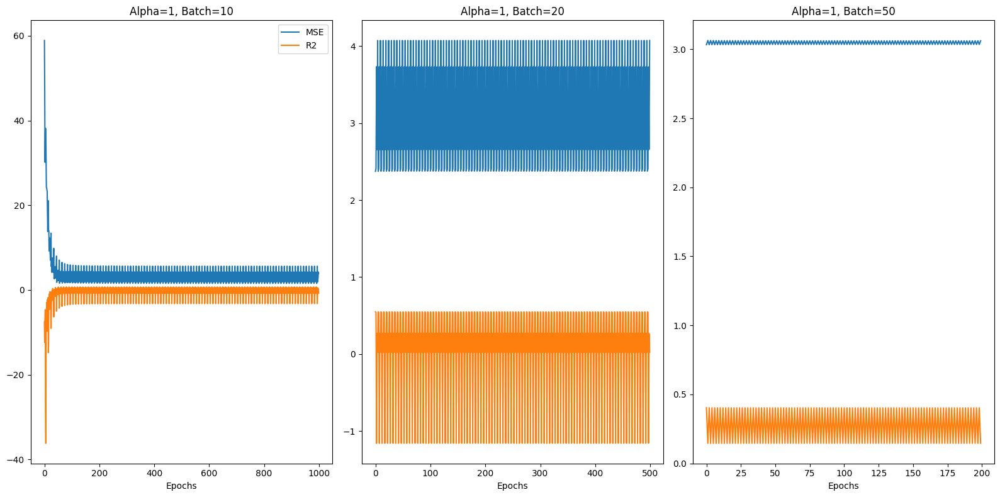

In [5]:
#SGD Ridge, without Momentum, Analytical Gradients:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return np.dot(x, params)

# Define the loss function (mean squared error with L2 regularization)
def mean_squared_error_np(params, x, y, alpha):
    predictions = linear_regression(params, x)
    mse = np.mean((predictions - y) ** 2)
    penalty = alpha * np.sum(params**2)  # L2 regularization
    return mse + penalty

# Initialize model parameters
params = np.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rate = 0.01  # Fixed learning rate
batch_sizes = [10, 20, 50]  # Batch sizes
alphas = [0.0001, 0.001, 0.01, 0.1, 1]  # Lambda values

# Lists to store the MSE and R2 values for different settings
results = {
    "alphas": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for alpha in alphas:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = np.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient analytically
                gradient = 2 * (np.dot(X_batch.T, error) / len(X_batch) + alpha * params)

                # Update parameters
                params -= learning_rate * gradient

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["alphas"].append(alpha)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Create plots for different alpha and batch size values
for alpha in alphas:
    plt.figure(figsize=(16, 8))
    for batch_size in batch_sizes:
        i = batch_sizes.index(batch_size)
        label = f"Alpha={alpha}, Batch={batch_size}"
        plt.subplot(1, len(batch_sizes), i + 1)
        plt.plot(results["mse_values"][i], label="MSE")
        plt.plot(results["r2_values"][i], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0:
            plt.legend()
    plt.tight_layout()
    plt.show()

Learned parameters: [3.0862122 2.7623045]


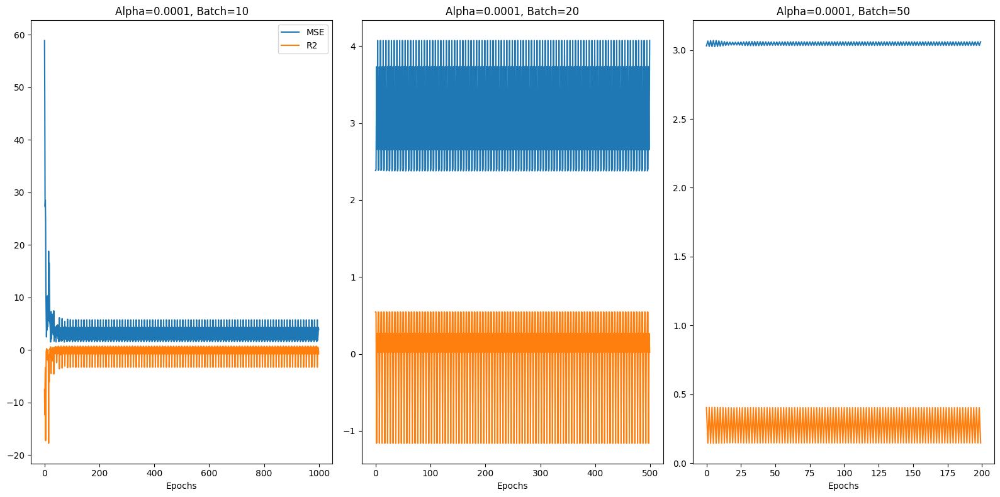

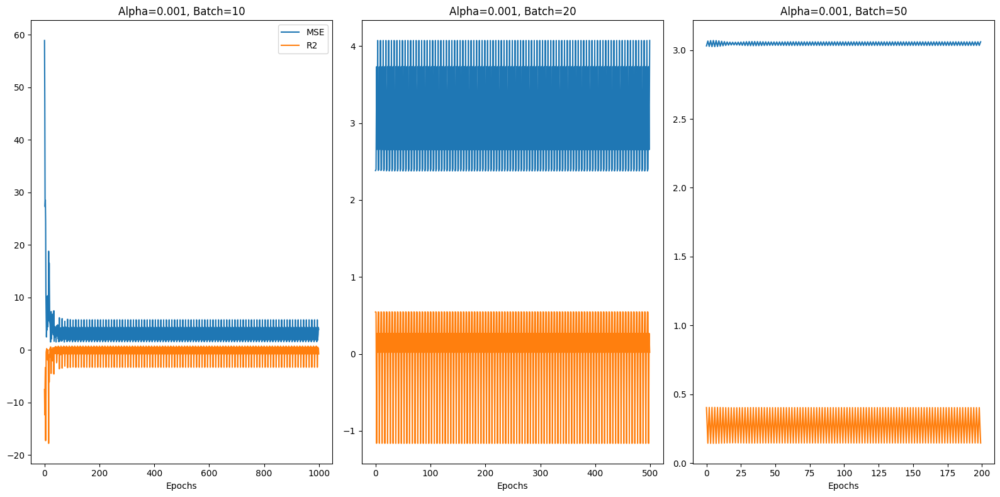

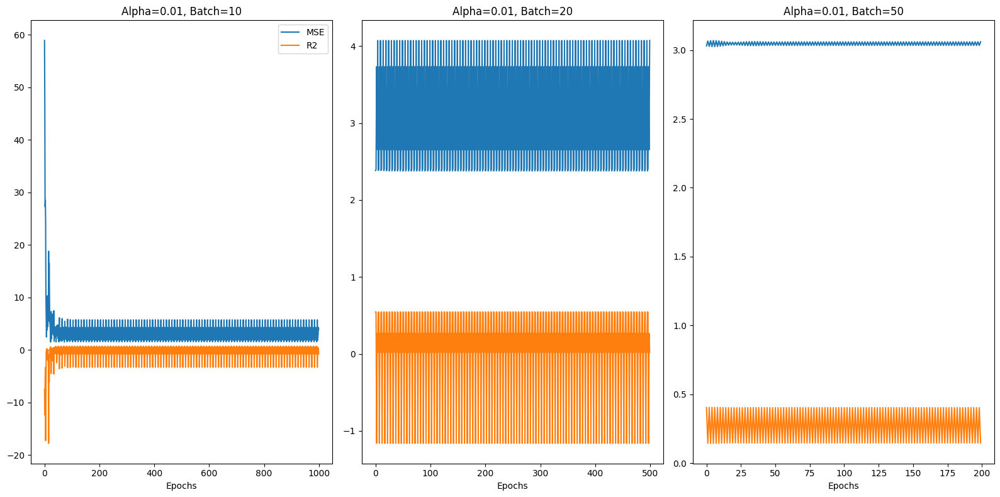

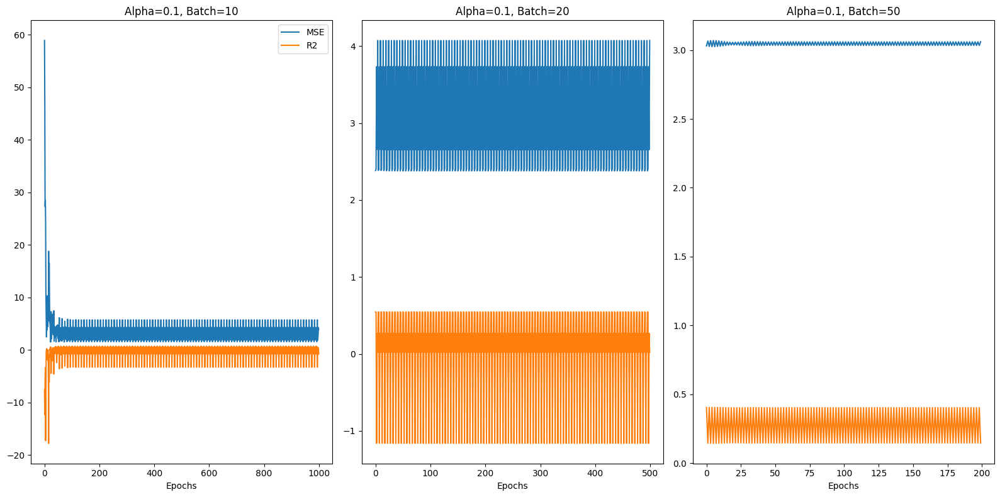

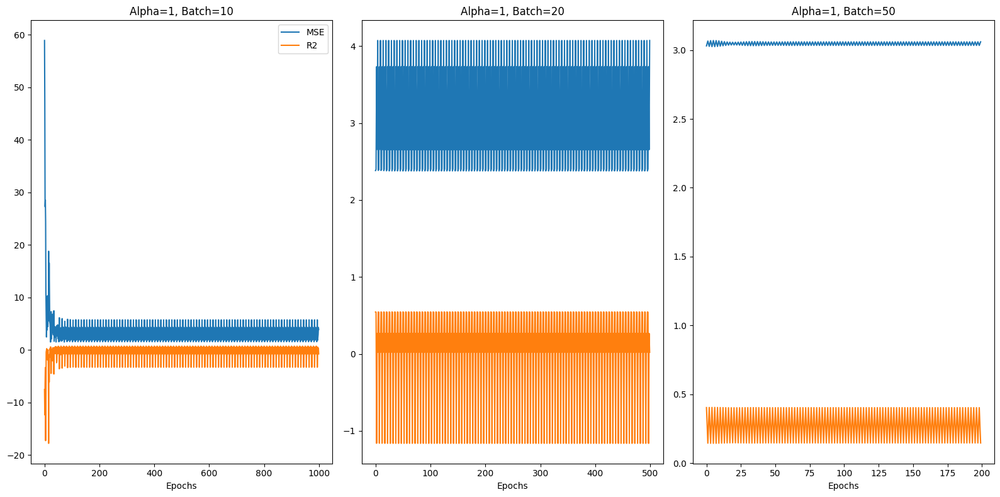

In [9]:
#Stochastic Gradient Descent, Ridge, with Momentum using JAX over a range of learning rates and
#batch sizes, with epochs=100
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error with L2 regularization)
def mean_squared_error_jax(params, x, y, alpha):
    predictions = linear_regression(params, x)
    mse = jnp.mean((predictions - y) ** 2)
    penalty = alpha * jnp.sum(params**2)  # L2 regularization
    return mse + penalty

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rate = 0.01  # Fixed learning rate
momentum = 0.9  # Momentum factor
batch_sizes = [10, 20, 50]  # Batch sizes
alphas = [0.0001, 0.001, 0.01, 0.1, 1]  # Lambda values

# Lists to store the MSE and R2 values for different settings
results = {
    "alphas": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for alpha in alphas:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        # Initialize velocity for momentum
        velocity = jnp.zeros_like(params)

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(lambda params: mean_squared_error_jax(params, X_batch, y_batch, alpha))(params)

                # Update velocity with momentum
                velocity = momentum * velocity - learning_rate * gradients

                # Update parameters with momentum
                params += velocity

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["alphas"].append(alpha)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Create plots for different alpha and batch size values
for alpha in alphas:
    plt.figure(figsize=(16, 8))
    for batch_size in batch_sizes:
        i = batch_sizes.index(batch_size)
        label = f"Alpha={alpha}, Batch={batch_size}"
        plt.subplot(1, len(batch_sizes), i + 1)
        plt.plot(results["mse_values"][i], label="MSE")
        plt.plot(results["r2_values"][i], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0:
            plt.legend()
    plt.tight_layout()
    plt.show()

Learned parameters: [4.6926165 3.714226 ]


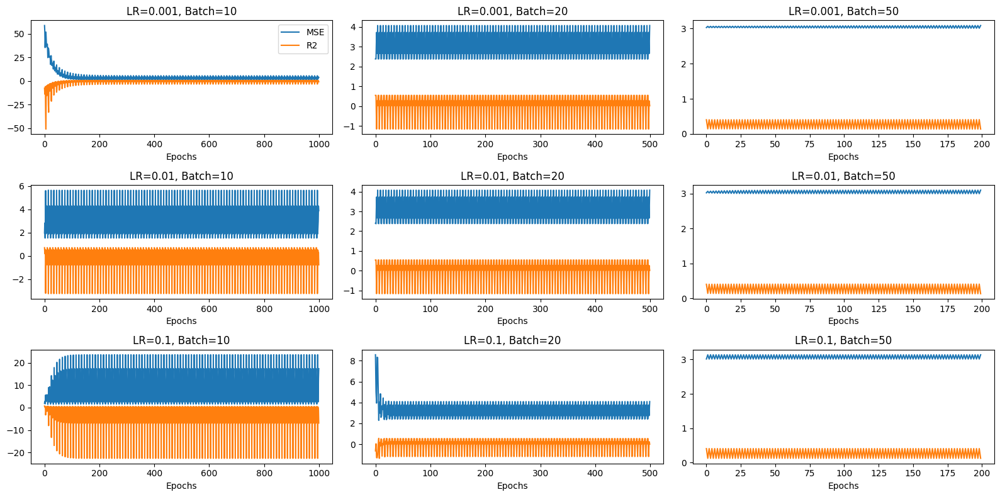

In [11]:
#Stochastic Gradient Descent, JAX, Using a range of learning rates, with momentum, for the OLS:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rates = [0.001, 0.01, 0.1]
batch_sizes = [10, 20, 50]
momentum = 0.9  # Momentum factor

# Lists to store the MSE and R2 values for different settings
results = {
    "learning_rates": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            velocity = jnp.zeros_like(params)  # Initialize velocity

            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(mean_squared_error_jax)(params, X_batch, y_batch)

                # Update velocity with momentum
                velocity = momentum * velocity - learning_rate * gradients

                # Update theta element-wise with momentum
                params += velocity

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["learning_rates"].append(learning_rate)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the results for different settings
plt.figure(figsize=(16, 8))
for i in range(len(learning_rates)):
    for j in range(len(batch_sizes)):
        label = f"LR={learning_rates[i]}, Batch={batch_sizes[j]}"
        plt.subplot(len(learning_rates), len(batch_sizes), i * len(batch_sizes) + j + 1)
        plt.plot(results["mse_values"][i * len(batch_sizes) + j], label="MSE")
        plt.plot(results["r2_values"][i * len(batch_sizes) + j], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0 and j == 0:
            plt.legend()

plt.tight_layout()
plt.show()

Learned parameters: [4.7006383  3.72288603]


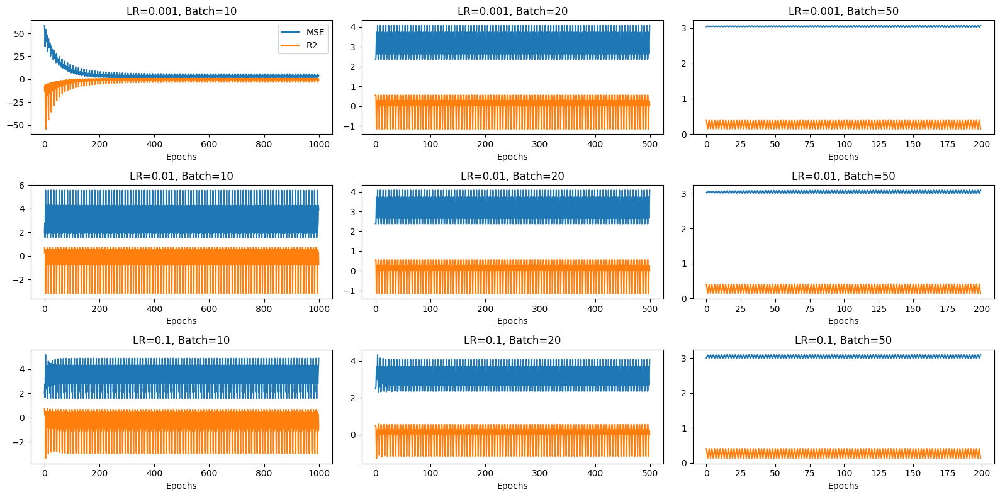

In [3]:
#SGD OLS with Momentum, using analytical gradients:

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return np.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error(params, x, y):
    predictions = linear_regression(params, x)
    return np.mean((predictions - y) ** 2)

# Gradient of the mean squared error with respect to parameters
def gradient(params, x, y):
    predictions = linear_regression(params, x)
    error = predictions - y
    gradient = np.dot(x.T, error) / len(x)
    return gradient

# Initialize model parameters
params = np.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rates = [0.001, 0.01, 0.1]
batch_sizes = [10, 20, 50]
momentum = 0.9  # Momentum factor

# Lists to store the MSE and R2 values for different settings
results = {
    "learning_rates": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            velocity = np.zeros_like(params)  # Initialize velocity

            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = np.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient manually
                gradients = gradient(params, X_batch, y_batch)

                # Update velocity with momentum
                velocity = momentum * velocity - learning_rate * gradients

                # Update theta element-wise with momentum
                params += velocity

                # Calculate MSE and R2 during training
                mse = mean_squared_error(params, X_batch, y_batch)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["learning_rates"].append(learning_rate)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the results for different settings
plt.figure(figsize=(16, 8))
for i in range(len(learning_rates)):
    for j in range(len(batch_sizes)):
        label = f"LR={learning_rates[i]}, Batch={batch_sizes[j]}"
        plt.subplot(len(learning_rates), len(batch_sizes), i * len(batch_sizes) + j + 1)
        plt.plot(results["mse_values"][i * len(batch_sizes) + j], label="MSE")
        plt.plot(results["r2_values"][i * len(batch_sizes) + j], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0 and j == 0:
            plt.legend()

plt.tight_layout()
plt.show()

Learned parameters: [3.08621222 2.76230406]


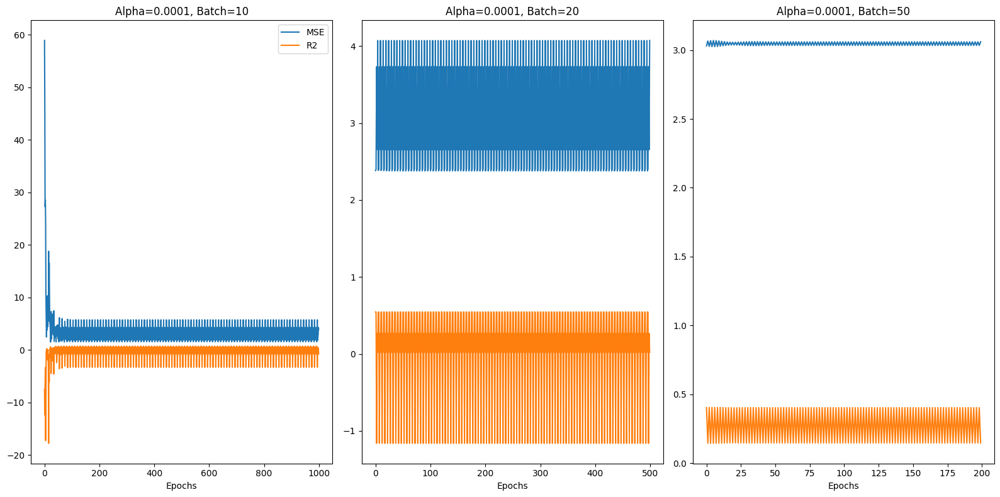

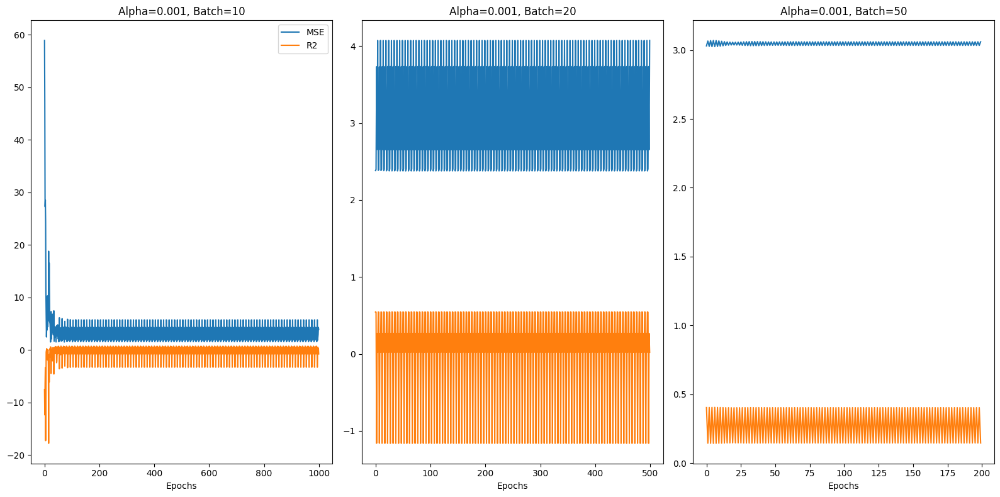

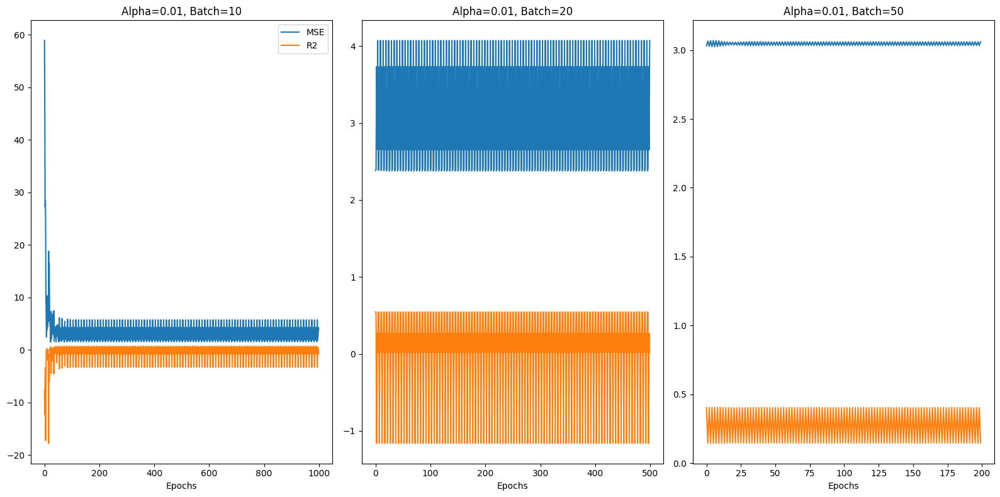

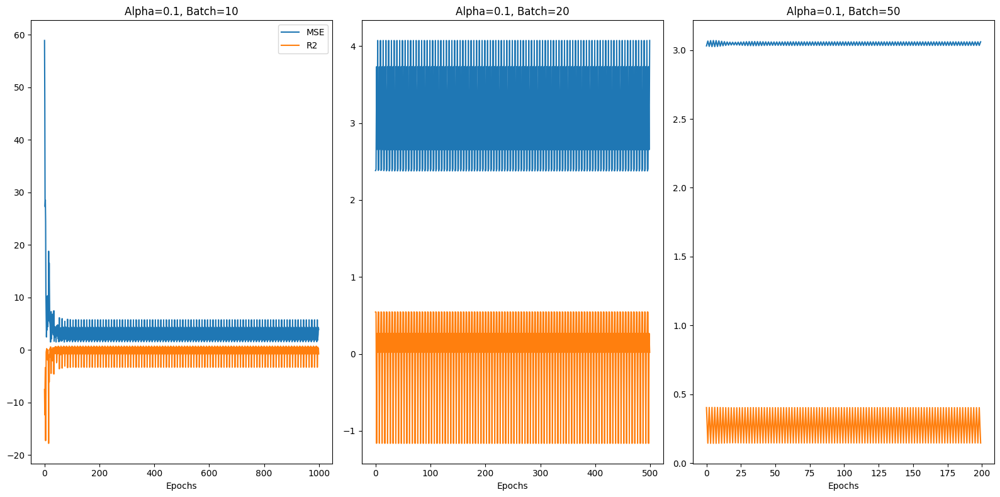

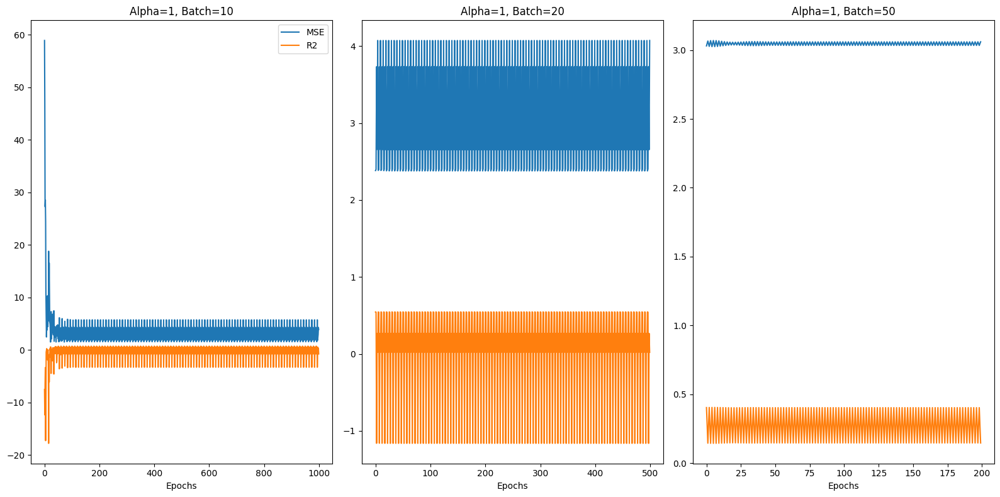

In [4]:
#Stochastic Gradient Descent, Ridge regression, using analytical expressions for the gradients, a number 
#of learning rates and batch sizes.
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return np.dot(x, params)

# Define the loss function (mean squared error with L2 regularization)
def mean_squared_error_np(params, x, y, alpha):
    predictions = linear_regression(params, x)
    mse = np.mean((predictions - y) ** 2)
    penalty = alpha * np.sum(params**2)  # L2 regularization
    return mse + penalty

# Initialize model parameters
params = np.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rate = 0.01  # Fixed learning rate
momentum = 0.9  # Momentum factor
batch_sizes = [10, 20, 50]  # Batch sizes
alphas = [0.0001, 0.001, 0.01, 0.1, 1]  # Lambda values

# Lists to store the MSE and R2 values for different settings
results = {
    "alphas": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for alpha in alphas:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        # Initialize velocity for momentum
        velocity = np.zeros_like(params)

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = np.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient analytically
                gradient = 2 * (np.dot(X_batch.T, error) / len(X_batch) + alpha * params)

                # Update velocity with momentum
                velocity = momentum * velocity - learning_rate * gradient

                # Update parameters with momentum
                params += velocity

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["alphas"].append(alpha)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Create plots for different alpha and batch size values
for alpha in alphas:
    plt.figure(figsize=(16, 8))
    for batch_size in batch_sizes:
        i = batch_sizes.index(batch_size)
        label = f"Alpha={alpha}, Batch={batch_size}"
        plt.subplot(1, len(batch_sizes), i + 1)
        plt.plot(results["mse_values"][i], label="MSE")
        plt.plot(results["r2_values"][i], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0:
            plt.legend()
    plt.tight_layout()
    plt.show()

Learned parameters: [1.596452  1.5954262]


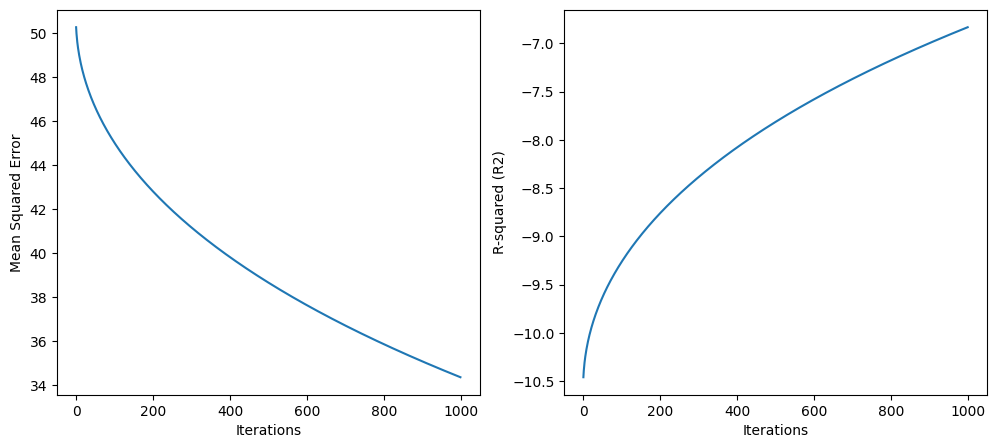

In [6]:
#THE MAIN RESULTS ARE NOW DONE: Now Relooping every plot using Adagrad, RMSProp and ADAM:
#Using plain gradient descent w. fixed learning rate and a no. of epochs for 
#automatic differentiation(JAX), OLS, Adagrad:

import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
learning_rate = 0.01
n_iterations = 1000

# Adagrad settings
epsilon = 1e-8
grad_squared_sum = jnp.zeros_like(params)

# Lists to store the MSE and R2 values
mse_list = []
r2_list = []

# Perform Adagrad optimization
for iteration in range(n_iterations):
    y_pred = jnp.dot(X, params)
    error = y_pred - y
    
    # Compute the gradient using JAX automatic differentiation
    gradients = jax.grad(mean_squared_error_jax)(params, X, y)
    
    # Accumulate squared gradients for Adagrad
    grad_squared_sum += jnp.square(gradients)
    
    # Calculate the update with Adagrad
    adjusted_learning_rate = learning_rate / (jnp.sqrt(grad_squared_sum) + epsilon)
    params -= adjusted_learning_rate * gradients

    # Calculate MSE and R2 during training
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    mse_list.append(mse)
    r2_list.append(r2)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the MSE and R2 values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(mse_list)
plt.xlabel('Iterations')
plt.ylabel('Mean Squared Error')
plt.subplot(1, 2, 2)
plt.plot(r2_list)
plt.xlabel('Iterations')
plt.ylabel('R-squared (R2)')

plt.show()

Learned parameters: [4.6364937 3.7307389]


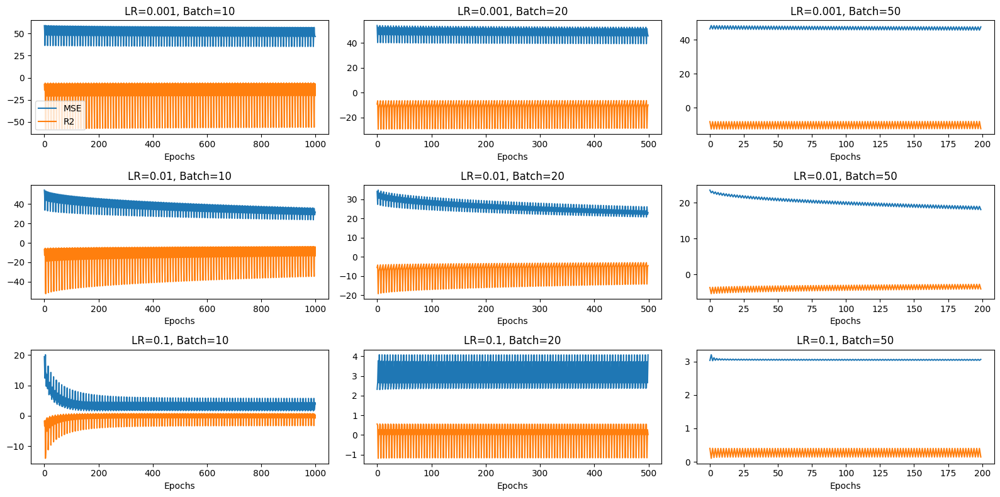

In [7]:
#Using stochastic gradient descent w. a number of learning rates and a no. of batches and epochs for 
#automatic differentiation(JAX), OLS, AdaGrad:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rates = [0.001, 0.01, 0.1]
batch_sizes = [10, 20, 50]

# Lists to store the MSE and R2 values for different settings
results = {
    "learning_rates": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        # Adagrad settings
        epsilon = 1e-8
        grad_squared_sum = jnp.zeros_like(params)

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(mean_squared_error_jax)(params, X_batch, y_batch)

                # Accumulate squared gradients for Adagrad
                grad_squared_sum += jnp.square(gradients)

                # Calculate the update with Adagrad
                adjusted_learning_rate = learning_rate / (jnp.sqrt(grad_squared_sum) + epsilon)
                params -= adjusted_learning_rate * gradients

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["learning_rates"].append(learning_rate)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the results for different settings
plt.figure(figsize=(16, 8))
for i in range(len(learning_rates)):
    for j in range(len(batch_sizes)):
        label = f"LR={learning_rates[i]}, Batch={batch_sizes[j]}"
        plt.subplot(len(learning_rates), len(batch_sizes), i * len(batch_sizes) + j + 1)
        plt.plot(results["mse_values"][i * len(batch_sizes) + j], label="MSE")
        plt.plot(results["r2_values"][i * len(batch_sizes) + j], label="R2")
        plt.xlabel('Epochs')  # Change 'Iterations' to 'Epochs'
        plt.title(label)
        if i == 0 and j == 0:
            plt.legend()

plt.tight_layout()
plt.show()

Theta from Ridge regression with AdaGrad (lambda = 0.0001):
[[1.497554 ]
 [3.9694815]]
Theta from Ridge regression with AdaGrad (lambda = 0.001):
[[1.5009806]
 [3.9603994]]
Theta from Ridge regression with AdaGrad (lambda = 0.01):
[[1.5352671]
 [3.869721 ]]
Theta from Ridge regression with AdaGrad (lambda = 0.1):
[[1.8683089]
 [3.010629 ]]
Theta from Ridge regression with AdaGrad (lambda = 1):
[[2.9687903 ]
 [0.56183237]]


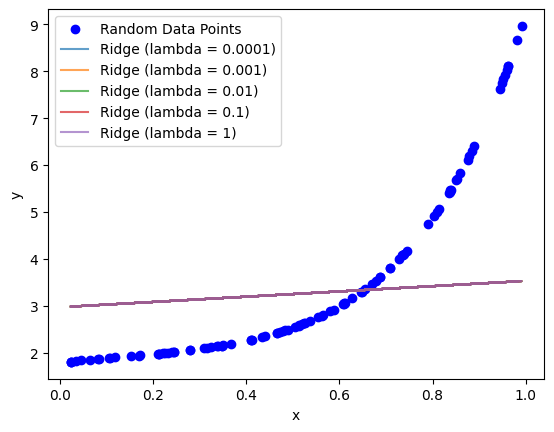

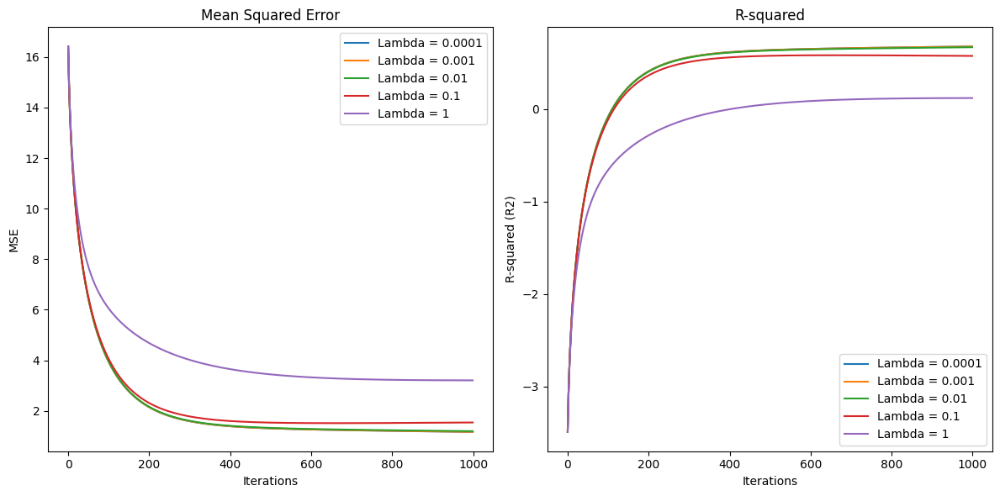

In [8]:
#Plain gradient descent, Ridge regression, using automatic differentiation(JAX), fixed learning rate, AdaGrad:
import numpy as np
import matplotlib.pyplot as plt
import jax
from jax import grad, random
from sklearn.metrics import mean_squared_error, r2_score

# Generate random data
n = 100
key = jax.random.PRNGKey(0)  # Create a random key for random number generation
x = jax.random.uniform(key, (n, 1))
y = 2.0 + 5 * x**4 * x + x**3 + x**2 + 0.1 * jax.random.normal(key, (n, 1))

# Add a column of ones to the input data for the bias term
X = jnp.c_[jnp.ones((n, 1)), x]

# Define the number of iterations and learning rate
n_iterations = 1000
learning_rate = 0.1

# List of lambda values
lambda_values = [0.0001, 0.001, 0.01, 0.1, 1]

# Create lists to store MSE and R-squared values during training
mse_list = {lmbda: [] for lmbda in lambda_values}
r2_list = {lmbda: [] for lmbda in lambda_values}

for lmbda in lambda_values:
    # Initialize random values for theta from a normal distribution
    theta = jax.random.normal(key, (2, 1))

    # Define the Ridge loss function
    def ridge_loss(theta):
        y_pred = X.dot(theta)
        mse = jnp.mean((y - y_pred) ** 2)
        ridge_term = lmbda * jnp.sum(theta[1:] ** 2)  # Ridge regularization term
        return mse + ridge_term

    # Compute the gradient of the loss function using automatic differentiation
    gradient_fn = grad(ridge_loss)

    # AdaGrad settings
    epsilon = 1e-8
    grad_squared_sum = jnp.zeros_like(theta)

    # Perform gradient descent with Ridge regularization and AdaGrad
    for iteration in range(n_iterations):
        gradients = gradient_fn(theta)
        
        # Accumulate squared gradients for AdaGrad
        grad_squared_sum += jnp.square(gradients)
        
        # Calculate the update with AdaGrad
        adjusted_learning_rate = learning_rate / (jnp.sqrt(grad_squared_sum) + epsilon)
        theta -= adjusted_learning_rate * gradients

        # Calculate MSE and R2 during training
        y_pred = X.dot(theta)
        mse = mean_squared_error(y, y_pred)
        r2 = r2_score(y, y_pred)
        mse_list[lmbda].append(mse)
        r2_list[lmbda].append(r2)

    print(f"Theta from Ridge regression with AdaGrad (lambda = {lmbda}):")
    print(theta)

# Rest of your code for plotting and visualization...

# Plot the data and the Ridge regression fits
plt.scatter(x, y, label='Random Data Points', color='blue')
for lmbda in lambda_values:
    plt.plot(x, X.dot(theta), label=f'Ridge (lambda = {lmbda})', alpha=0.7)

plt.xlabel('x')
plt.ylabel('y')
plt.legend()

# Plot MSE and R2 over iterations for different lambda values
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
for lmbda in lambda_values:
    plt.plot(range(n_iterations), mse_list[lmbda], label=f'Lambda = {lmbda}')
plt.xlabel('Iterations')
plt.ylabel('MSE')
plt.title('Mean Squared Error')
plt.legend()

plt.subplot(1, 2, 2)
for lmbda in lambda_values:
    plt.plot(range(n_iterations), r2_list[lmbda], label=f'Lambda = {lmbda}')
plt.xlabel('Iterations')
plt.ylabel('R-squared (R2)')
plt.title('R-squared')
plt.legend()

plt.tight_layout()
plt.show()

Learned parameters: [4.6342745 3.7304904]


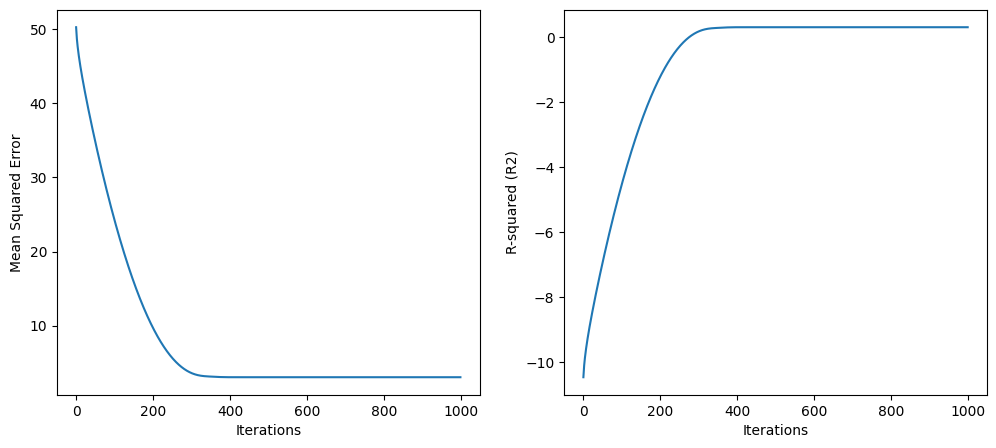

In [9]:
#RMSProp 1 GD OLS:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
learning_rate = 0.01
n_iterations = 1000

# RMSProp settings
epsilon = 1e-8
decay_rate = 0.9  # RMSProp decay rate
squared_gradients = jnp.zeros_like(params)

# Lists to store the MSE and R2 values
mse_list = []
r2_list = []

# Perform RMSProp optimization
for iteration in range(n_iterations):
    y_pred = jnp.dot(X, params)
    error = y_pred - y
    
    # Compute the gradient using JAX automatic differentiation
    gradients = jax.grad(mean_squared_error_jax)(params, X, y)
    
    # Calculate the squared gradients
    squared_gradients = decay_rate * squared_gradients + (1 - decay_rate) * jnp.square(gradients)
    
    # Calculate the update with RMSProp
    adjusted_learning_rate = learning_rate / (jnp.sqrt(squared_gradients) + epsilon)
    params -= adjusted_learning_rate * gradients

    # Calculate MSE and R2 during training
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    mse_list.append(mse)
    r2_list.append(r2)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the MSE and R2 values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(mse_list)
plt.xlabel('Iterations')
plt.ylabel('Mean Squared Error')
plt.subplot(1, 2, 2)
plt.plot(r2_list)
plt.xlabel('Iterations')
plt.ylabel('R-squared (R2)')

plt.show()

Learned parameters: [4.5913506 3.6735046]


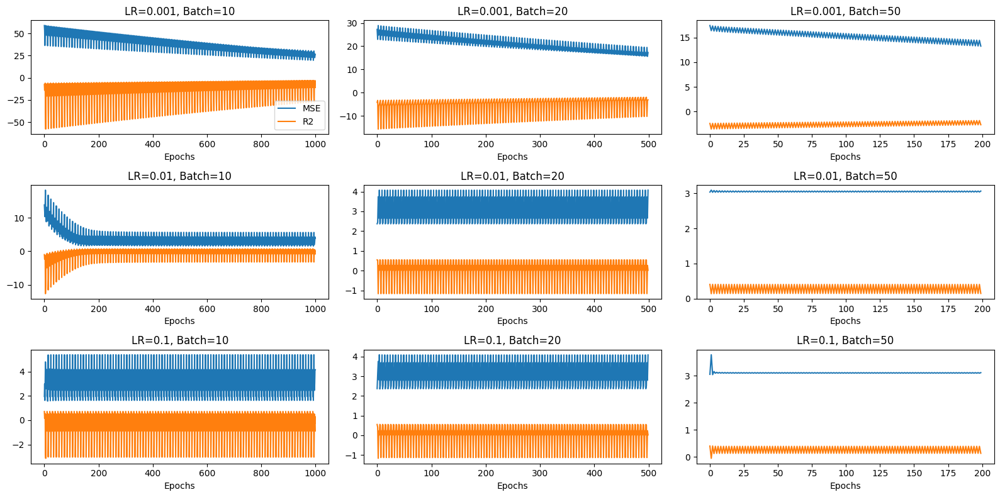

In [10]:
#RMSProp 2 SGD OLS:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rates = [0.001, 0.01, 0.1]
batch_sizes = [10, 20, 50]

# Lists to store the MSE and R2 values for different settings
results = {
    "learning_rates": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        # RMSProp settings
        epsilon = 1e-8
        decay_rate = 0.9  # RMSProp decay rate
        squared_gradients = jnp.zeros_like(params)

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(mean_squared_error_jax)(params, X_batch, y_batch)

                # Calculate the squared gradients
                squared_gradients = decay_rate * squared_gradients + (1 - decay_rate) * jnp.square(gradients)

                # Calculate the update with RMSProp
                adjusted_learning_rate = learning_rate / (jnp.sqrt(squared_gradients) + epsilon)
                params -= adjusted_learning_rate * gradients

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["learning_rates"].append(learning_rate)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the results for different settings
plt.figure(figsize=(16, 8))
for i in range(len(learning_rates)):
    for j in range(len(batch_sizes)):
        label = f"LR={learning_rates[i]}, Batch={batch_sizes[j]}"
        plt.subplot(len(learning_rates), len(batch_sizes), i * len(batch_sizes) + j + 1)
        plt.plot(results["mse_values"][i * len(batch_sizes) + j], label="MSE")
        plt.plot(results["r2_values"][i * len(batch_sizes) + j], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0 and j == 0:
            plt.legend()

plt.tight_layout()
plt.show()

Theta from Ridge regression with RMSProp (lambda = 0.0001):
[[0.3982398]
 [6.0632305]]
Theta from Ridge regression with RMSProp (lambda = 0.001):
[[0.43430832]
 [5.9944763 ]]
Theta from Ridge regression with RMSProp (lambda = 0.01):
[[0.65428424]
 [5.2845354 ]]
Theta from Ridge regression with RMSProp (lambda = 0.1):
[[2.0715365]
 [2.5829558]]
Theta from Ridge regression with RMSProp (lambda = 1):
[[3.3250217]
 [0.4841718]]


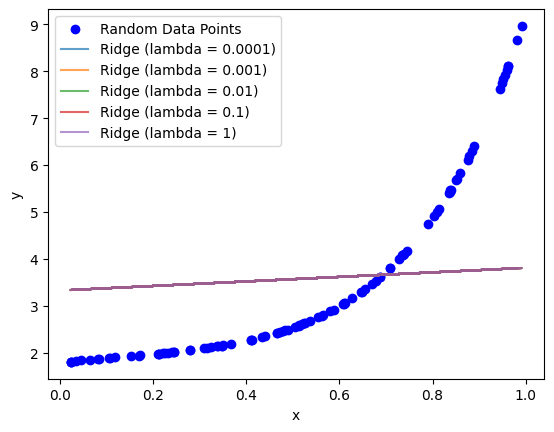

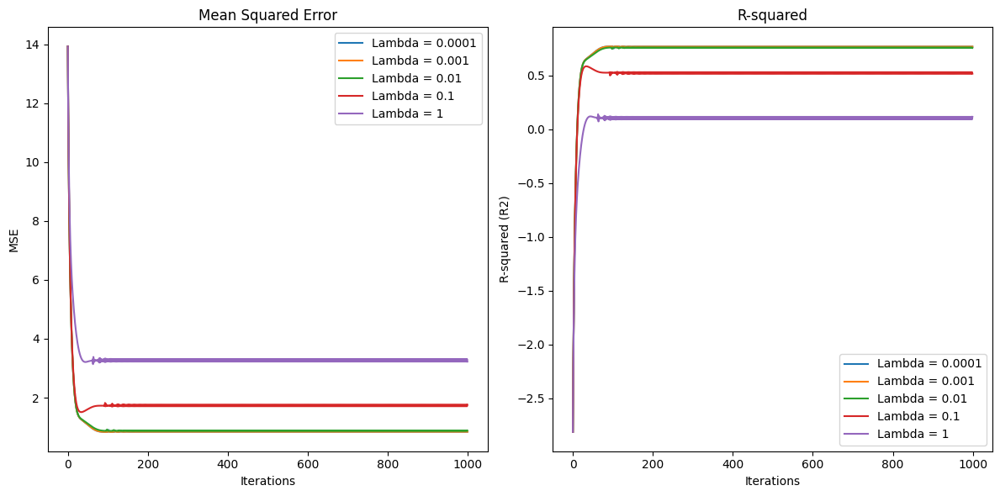

In [12]:
#RMSProp 3 GD Ridge:
import numpy as np
import matplotlib.pyplot as plt
import jax
from jax import grad, random
from sklearn.metrics import mean_squared_error, r2_score

# Generate random data
n = 100
key = jax.random.PRNGKey(0)  # Create a random key for random number generation
x = jax.random.uniform(key, (n, 1))
y = 2.0 + 5 * x**4 * x + x**3 + x**2 + 0.1 * jax.random.normal(key, (n, 1))

# Add a column of ones to the input data for the bias term
X = jnp.c_[jnp.ones((n, 1)), x]

# Define the number of iterations and learning rate
n_iterations = 1000
learning_rate = 0.1

# List of lambda values
lambda_values = [0.0001, 0.001, 0.01, 0.1, 1]

# Create lists to store MSE and R-squared values during training
mse_list = {lmbda: [] for lmbda in lambda_values}
r2_list = {lmbda: [] for lmbda in lambda_values}

for lmbda in lambda_values:
    # Initialize random values for theta from a normal distribution
    theta = jax.random.normal(key, (2, 1))

    # Define the Ridge loss function
    def ridge_loss(theta):
        y_pred = X.dot(theta)
        mse = jnp.mean((y - y_pred) ** 2)
        ridge_term = lmbda * jnp.sum(theta[1:] ** 2)  # Ridge regularization term
        return mse + ridge_term

    # Compute the gradient of the loss function using automatic differentiation
    gradient_fn = grad(ridge_loss)

    # RMSProp settings
    epsilon = 1e-8
    decay_rate = 0.9  # RMSProp decay rate
    squared_gradients = jnp.zeros_like(theta)

    # Perform gradient descent with Ridge regularization and RMSProp
    for iteration in range(n_iterations):
        gradients = gradient_fn(theta)
        
        # Accumulate squared gradients for RMSProp
        squared_gradients = decay_rate * squared_gradients + (1 - decay_rate) * jnp.square(gradients)
        
        # Calculate the update with RMSProp
        adjusted_learning_rate_rmsprop = learning_rate / (jnp.sqrt(squared_gradients) + epsilon)
        theta -= adjusted_learning_rate_rmsprop * gradients

        # Calculate MSE and R2 during training
        y_pred = X.dot(theta)
        mse = mean_squared_error(y, y_pred)
        r2 = r2_score(y, y_pred)
        mse_list[lmbda].append(mse)
        r2_list[lmbda].append(r2)

    print(f"Theta from Ridge regression with RMSProp (lambda = {lmbda}):")
    print(theta)

# Rest of your code for plotting and visualization...

# Plot the data and the Ridge regression fits
plt.scatter(x, y, label='Random Data Points', color='blue')
for lmbda in lambda_values:
    plt.plot(x, X.dot(theta), label=f'Ridge (lambda = {lmbda})', alpha=0.7)

plt.xlabel('x')
plt.ylabel('y')
plt.legend()

# Plot MSE and R2 over iterations for different lambda values
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
for lmbda in lambda_values:
    plt.plot(range(n_iterations), mse_list[lmbda], label=f'Lambda = {lmbda}')
plt.xlabel('Iterations')
plt.ylabel('MSE')
plt.title('Mean Squared Error')
plt.legend()

plt.subplot(1, 2, 2)
for lmbda in lambda_values:
    plt.plot(range(n_iterations), r2_list[lmbda], label=f'Lambda = {lmbda}')
plt.xlabel('Iterations')
plt.ylabel('R-squared (R2)')
plt.title('R-squared')
plt.legend()

plt.tight_layout()
plt.show()

Learned parameters: [3.2336977 2.6938798]


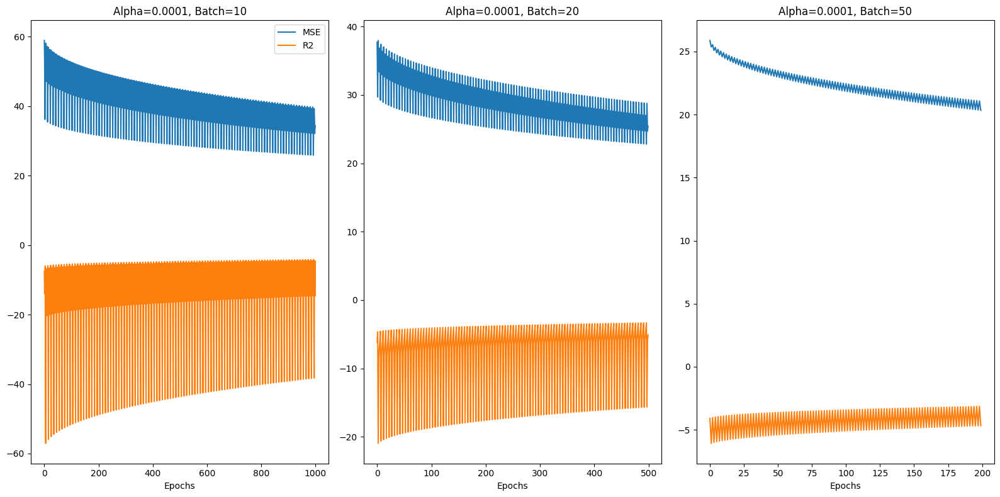

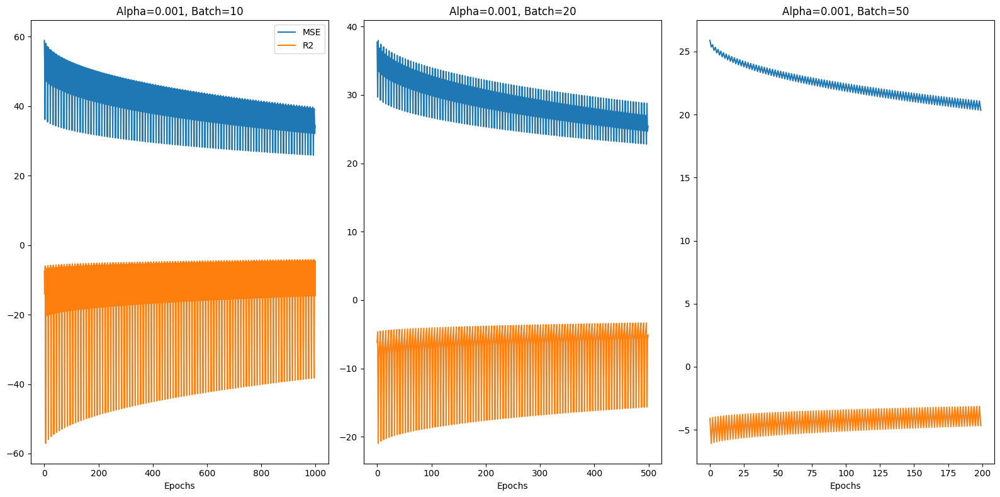

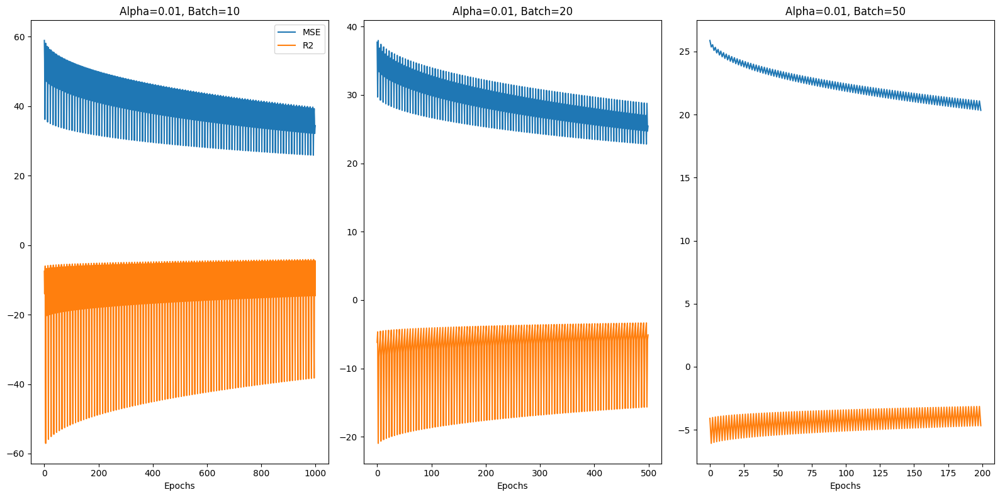

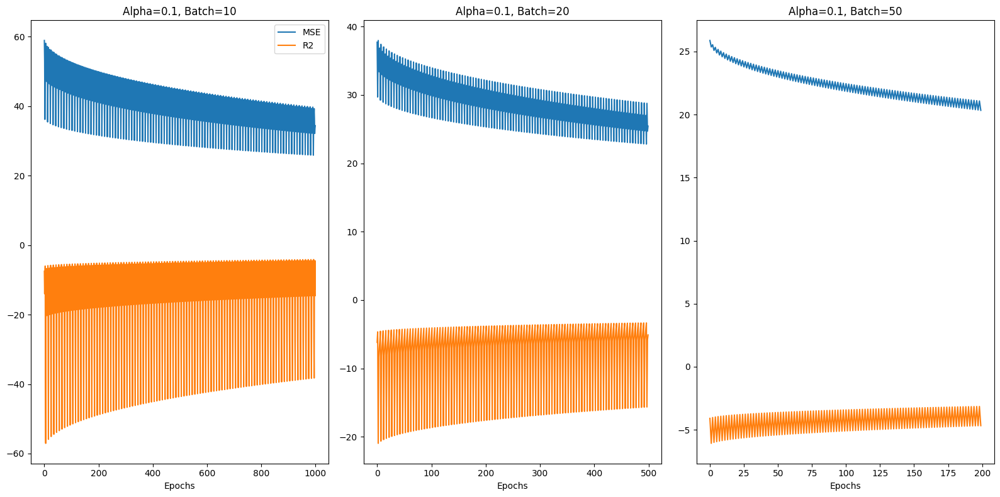

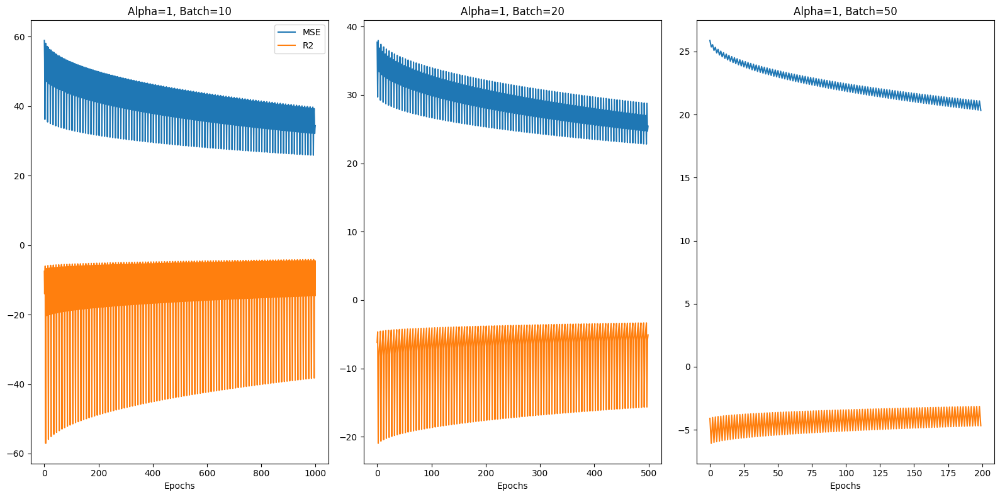

In [13]:
#SGD Ridge Adagrad4: 

import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error with L2 regularization)
def mean_squared_error_jax(params, x, y, alpha):
    predictions = linear_regression(params, x)
    mse = jnp.mean((predictions - y) ** 2)
    penalty = alpha * jnp.sum(params**2)  # L2 regularization
    return mse + penalty

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rate = 0.01  # Fixed learning rate
batch_sizes = [10, 20, 50]  # Batch sizes
alphas = [0.0001, 0.001, 0.01, 0.1, 1]  # Lambda values

# Lists to store the MSE and R2 values for different settings
results = {
    "alphas": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for alpha in alphas:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        # Initialize squared gradient accumulator for AdaGrad
        squared_grad_accumulator = jnp.zeros(params.shape)

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(lambda params: mean_squared_error_jax(params, X_batch, y_batch, alpha))(params)

                # Accumulate squared gradients for AdaGrad
                squared_grad_accumulator += gradients ** 2

                # Calculate the adaptive learning rate for AdaGrad
                adjusted_learning_rate = learning_rate / (jnp.sqrt(squared_grad_accumulator) + 1e-8)

                # Update theta element-wise with AdaGrad
                params -= adjusted_learning_rate * gradients

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["alphas"].append(alpha)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Create plots for different alpha and batch size values
for alpha in alphas:
    plt.figure(figsize=(16, 8))
    for batch_size in batch_sizes:
        i = batch_sizes.index(batch_size)
        label = f"Alpha={alpha}, Batch={batch_size}"
        plt.subplot(1, len(batch_sizes), i + 1)
        plt.plot(results["mse_values"][i], label="MSE")
        plt.plot(results["r2_values"][i], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0:
            plt.legend()
    plt.tight_layout()
    plt.show()

Learned parameters: [3.0817554 2.7664914]


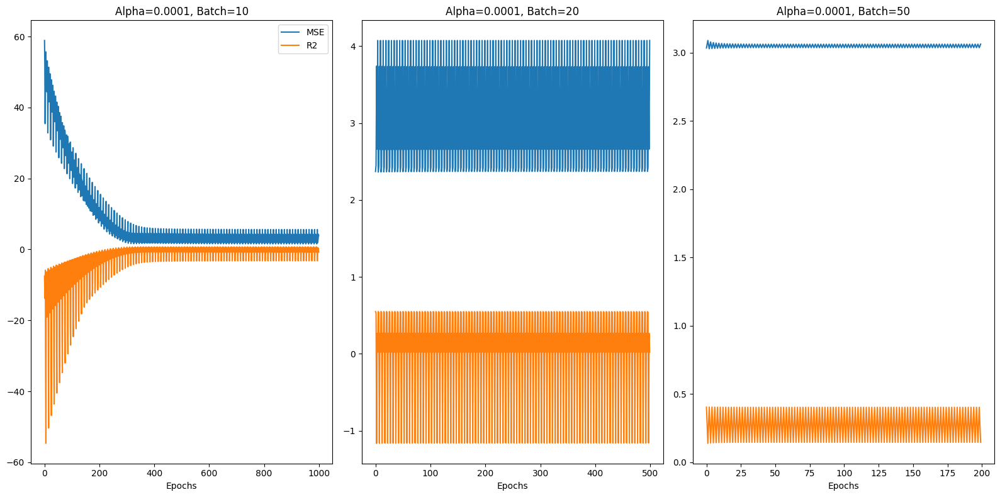

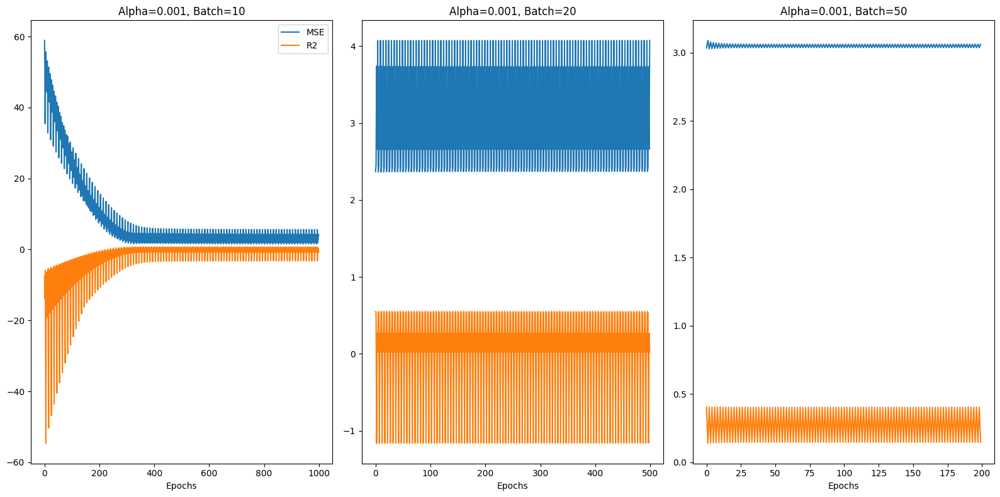

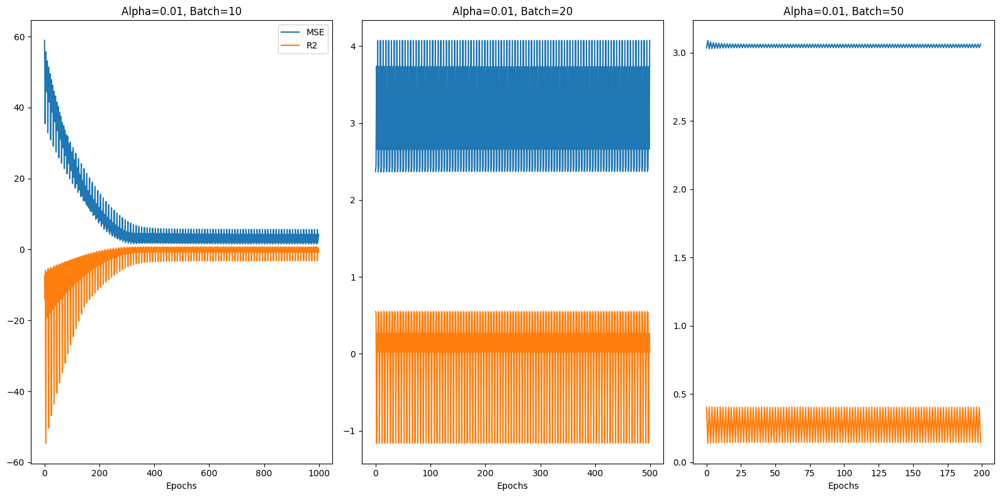

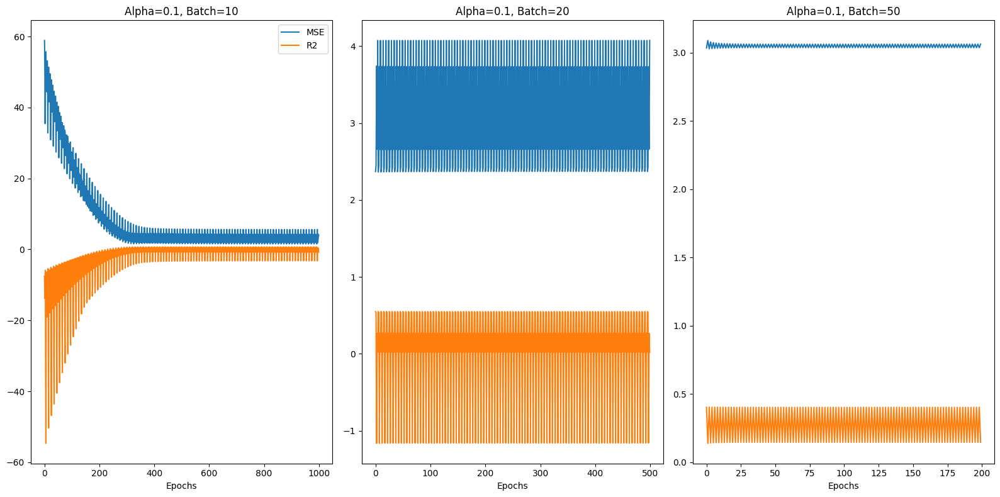

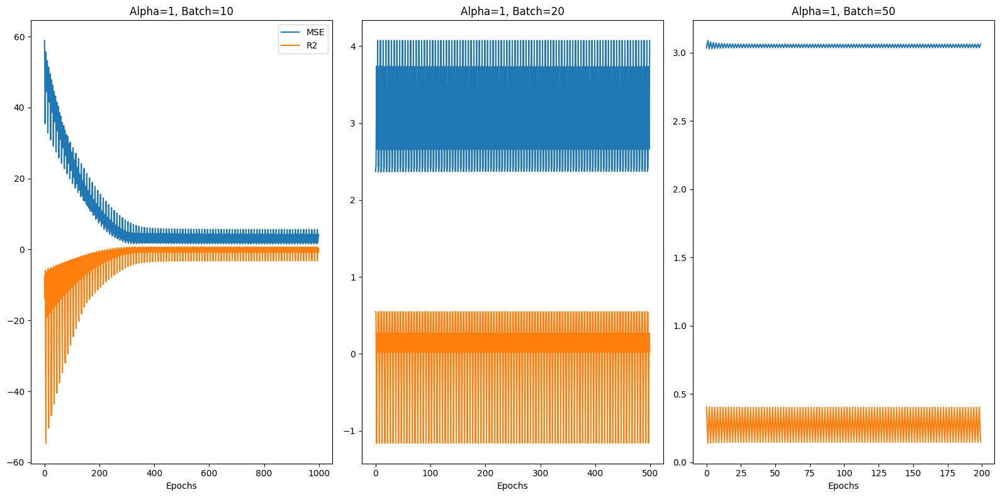

In [14]:
#SGD Ridge JAX RMSProp:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error with L2 regularization)
def mean_squared_error_jax(params, x, y, alpha):
    predictions = linear_regression(params, x)
    mse = jnp.mean((predictions - y) ** 2)
    penalty = alpha * jnp.sum(params**2)  # L2 regularization
    return mse + penalty

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rate = 0.01  # Fixed learning rate
batch_sizes = [10, 20, 50]  # Batch sizes
alphas = [0.0001, 0.001, 0.01, 0.1, 1]  # Lambda values

# Lists to store the MSE and R2 values for different settings
results = {
    "alphas": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for alpha in alphas:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        # Initialize squared gradient accumulator for RMSProp
        squared_grad_accumulator = jnp.zeros(params.shape)

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(lambda params: mean_squared_error_jax(params, X_batch, y_batch, alpha))(params)

                # RMSProp settings
                decay_rate = 0.9  # RMSProp's decay rate
                epsilon = 1e-8

                # Accumulate squared gradients for RMSProp with decay
                squared_grad_accumulator = decay_rate * squared_grad_accumulator + (1 - decay_rate) * jnp.square(gradients)

                # Calculate the adaptive learning rate for RMSProp
                adjusted_learning_rate = learning_rate / (jnp.sqrt(squared_grad_accumulator) + epsilon)

                # Update theta element-wise with RMSProp
                params -= adjusted_learning_rate * gradients

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["alphas"].append(alpha)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Create plots for different alpha and batch size values
for alpha in alphas:
    plt.figure(figsize=(16, 8))
    for batch_size in batch_sizes:
        i = batch_sizes.index(batch_size)
        label = f"Alpha={alpha}, Batch={batch_size}"
        plt.subplot(1, len(batch_sizes), i + 1)
        plt.plot(results["mse_values"][i], label="MSE")
        plt.plot(results["r2_values"][i], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0:
            plt.legend()
    plt.tight_layout()
    plt.show()

Learned parameters: [4.639274  3.7354906]


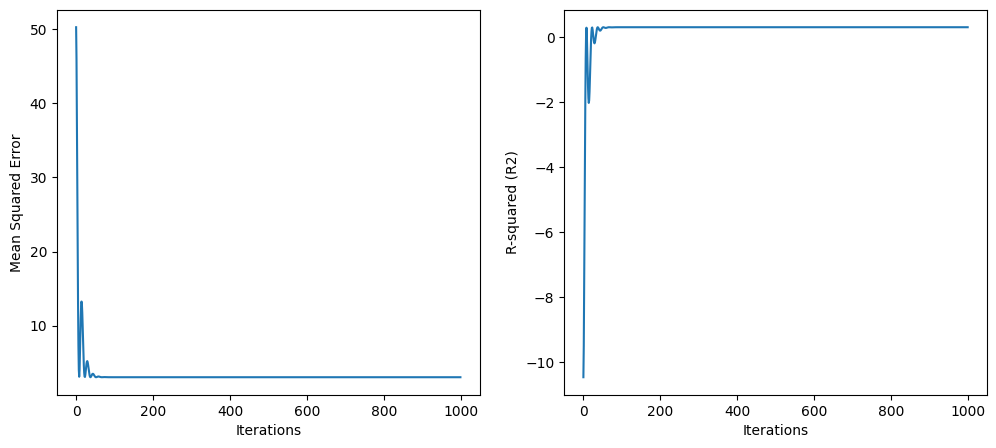

In [15]:
#Using plain gradient descent w. fixed learning rate and a no. of epochs for 
#automatic differentiation(JAX), OLS, Adagrad:
#With Momentum:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
learning_rate = 0.01
n_iterations = 1000
momentum = 0.9  # Momentum coefficient

# Initialize the momentum term
momentum_term = jnp.zeros_like(params)

# Lists to store the MSE and R2 values
mse_list = []
r2_list = []

# Perform gradient descent optimization with momentum
for iteration in range(n_iterations):
    y_pred = jnp.dot(X, params)
    error = y_pred - y
    
    # Compute the gradient using JAX automatic differentiation
    gradients = jax.grad(mean_squared_error_jax)(params, X, y)
    
    # Update the momentum term
    momentum_term = momentum * momentum_term - learning_rate * gradients
    
    # Update the parameters with momentum
    params += momentum_term

    # Calculate MSE and R2 during training
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    mse_list.append(mse)
    r2_list.append(r2)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the MSE and R2 values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(mse_list)
plt.xlabel('Iterations')
plt.ylabel('Mean Squared Error')
plt.subplot(1, 2, 2)
plt.plot(r2_list)
plt.xlabel('Iterations')
plt.ylabel('R-squared (R2)')

plt.show()

Learned parameters: [4.6235037 3.720665 ]


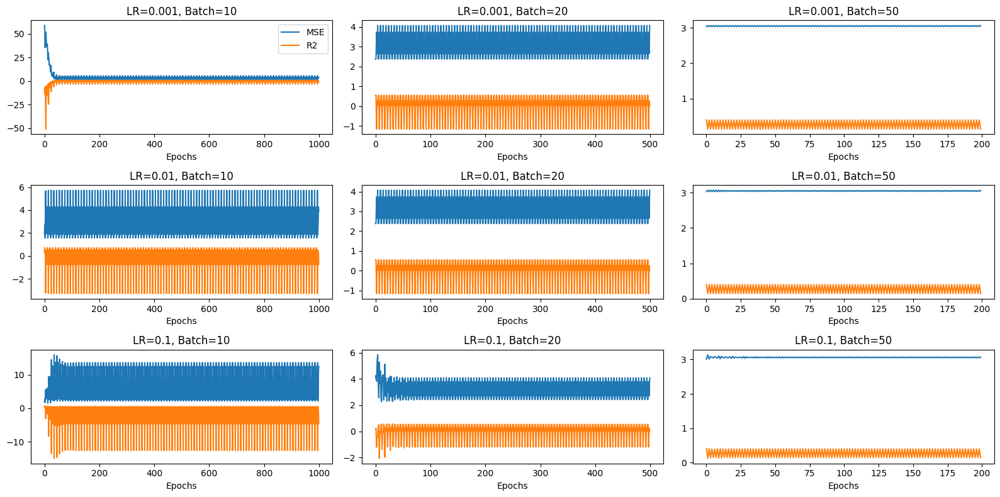

In [16]:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rates = [0.001, 0.01, 0.1]
batch_sizes = [10, 20, 50]

# Lists to store the MSE and R2 values for different settings
results = {
    "learning_rates": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        # Momentum settings
        momentum = 0.9
        velocity = jnp.zeros_like(params)

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(mean_squared_error_jax)(params, X_batch, y_batch)

                # Update the momentum term
                velocity = momentum * velocity + learning_rate * gradients

                # Update the parameters with momentum
                params -= velocity

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["learning_rates"].append(learning_rate)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the results for different settings
plt.figure(figsize=(16, 8))
for i in range(len(learning_rates)):
    for j in range(len(batch_sizes)):
        label = f"LR={learning_rates[i]}, Batch={batch_sizes[j]}"
        plt.subplot(len(learning_rates), len(batch_sizes), i * len(batch_sizes) + j + 1)
        plt.plot(results["mse_values"][i * len(batch_sizes) + j], label="MSE")
        plt.plot(results["r2_values"][i * len(batch_sizes) + j], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0 and j == 0:
            plt.legend()

plt.tight_layout()
plt.show()

Theta from Ridge regression with AdaGrad and Momentum (lambda = 0.0001):
[[0.34836376]
 [6.0130143 ]]
Theta from Ridge regression with AdaGrad and Momentum (lambda = 0.001):
[[0.38441527]
 [5.94429   ]]
Theta from Ridge regression with AdaGrad and Momentum (lambda = 0.01):
[[0.70431006]
 [5.3344903 ]]
Theta from Ridge regression with AdaGrad and Momentum (lambda = 0.1):
[[2.1215332]
 [2.632961 ]]
Theta from Ridge regression with AdaGrad and Momentum (lambda = 1):
[[3.2750218 ]
 [0.43417147]]


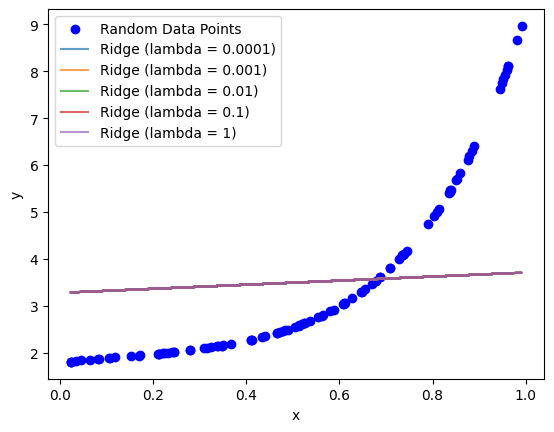

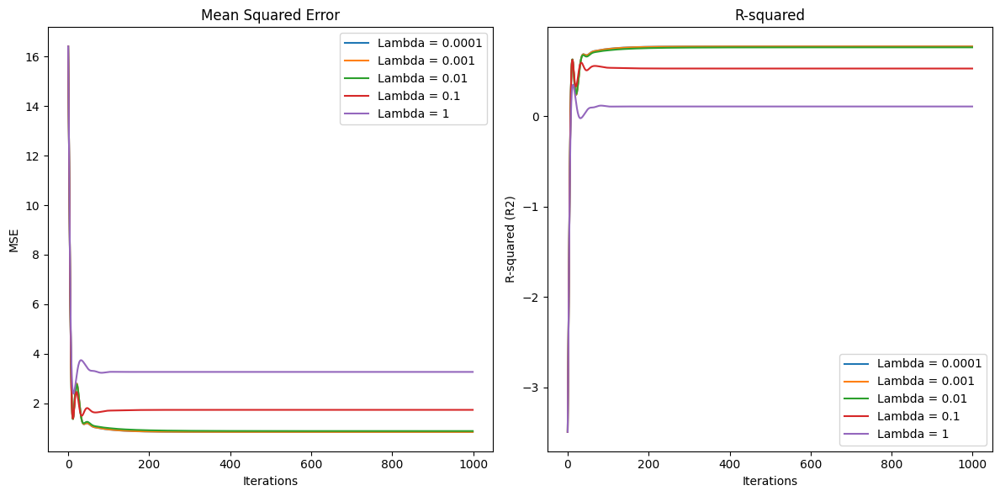

In [17]:
#Plain gradient descent, Ridge regression, using automatic differentiation(JAX), fixed learning rate, AdaGrad with momentum:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate random data
n = 100
key = jax.random.PRNGKey(0)
x = jax.random.uniform(key, (n, 1))
y = 2.0 + 5 * x**4 * x + x**3 + x**2 + 0.1 * jax.random.normal(key, (n, 1))

X = jnp.c_[jnp.ones((n, 1)), x]

n_iterations = 1000
learning_rate = 0.1
lambda_values = [0.0001, 0.001, 0.01, 0.1, 1]

mse_list = {lmbda: [] for lmbda in lambda_values}
r2_list = {lmbda: [] for lmbda in lambda_values}

for lmbda in lambda_values:
    theta = jax.random.normal(key, (2, 1))
    gradient_fn = jax.grad(ridge_loss)
    
    # AdaGrad settings
    epsilon = 1e-8
    grad_squared_sum = jnp.zeros_like(theta)

    # Momentum settings
    momentum = 0.9
    velocity = jnp.zeros_like(theta)

    for iteration in range(n_iterations):
        gradients = gradient_fn(theta)
        
        grad_squared_sum += jnp.square(gradients)
        adjusted_learning_rate = learning_rate / (jnp.sqrt(grad_squared_sum) + epsilon)

        # Calculate the momentum term
        velocity = momentum * velocity + adjusted_learning_rate * gradients

        # Update theta with momentum
        theta -= velocity

        y_pred = X.dot(theta)
        mse = mean_squared_error(y, y_pred)
        r2 = r2_score(y, y_pred)
        mse_list[lmbda].append(mse)
        r2_list[lmbda].append(r2)

    print(f"Theta from Ridge regression with AdaGrad and Momentum (lambda = {lmbda}):")
    print(theta)

# Rest of your code for plotting and visualization...

# Plot the data and the Ridge regression fits
plt.scatter(x, y, label='Random Data Points', color='blue')
for lmbda in lambda_values:
    plt.plot(x, X.dot(theta), label=f'Ridge (lambda = {lmbda})', alpha=0.7)

plt.xlabel('x')
plt.ylabel('y')
plt.legend()

# Plot MSE and R2 over iterations for different lambda values
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
for lmbda in lambda_values:
    plt.plot(range(n_iterations), mse_list[lmbda], label=f'Lambda = {lmbda}')
plt.xlabel('Iterations')
plt.ylabel('MSE')
plt.title('Mean Squared Error')
plt.legend()

plt.subplot(1, 2, 2)
for lmbda in lambda_values:
    plt.plot(range(n_iterations), r2_list[lmbda], label=f'Lambda = {lmbda}')
plt.xlabel('Iterations')
plt.ylabel('R-squared (R2)')
plt.title('R-squared')
plt.legend()

plt.tight_layout()
plt.show()

Learned parameters: [4.634212  3.7304306]


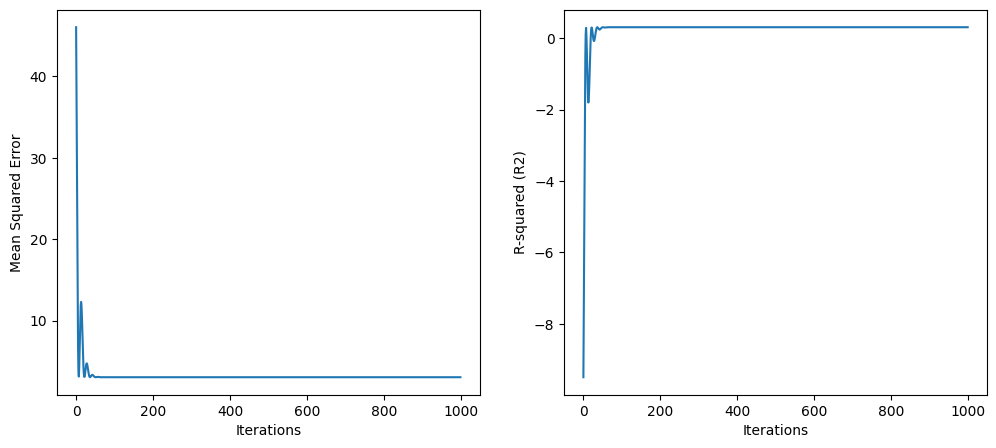

In [19]:
#Plain GD, OLS, JAX, RMSProp with Momentum:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
learning_rate = 0.01
n_iterations = 1000

# RMSProp settings
epsilon = 1e-8
decay_rate = 0.9  # RMSProp decay rate
squared_gradients = jnp.zeros_like(params)

# Momentum settings (NAG)
momentum = 0.9
velocity = jnp.zeros_like(params)

# Lists to store the MSE and R2 values
mse_list = []
r2_list = []

# Perform RMSProp optimization with NAG
for iteration in range(n_iterations):
    # Update parameters with Nesterov Accelerated Gradient
    # Calculate gradients using predicted parameters (params - learning_rate * velocity)
    gradients = jax.grad(mean_squared_error_jax)(params - learning_rate * velocity, X, y)

    # Update velocity using NAG formula
    velocity = momentum * velocity + learning_rate * gradients

    # Update parameters with the velocity
    params -= velocity
    
    y_pred = jnp.dot(X, params)
    error = y_pred - y

    # Compute the gradient using JAX automatic differentiation
    gradients = jax.grad(mean_squared_error_jax)(params, X, y)

    # Calculate the squared gradients for RMSProp
    squared_gradients = decay_rate * squared_gradients + (1 - decay_rate) * jnp.square(gradients)

    # Calculate the update with RMSProp
    adjusted_learning_rate = learning_rate / (jnp.sqrt(squared_gradients) + epsilon)
    params -= adjusted_learning_rate * gradients

    # Calculate MSE and R2 during training
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    mse_list.append(mse)
    r2_list.append(r2)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the MSE and R2 values
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(mse_list)
plt.xlabel('Iterations')
plt.ylabel('Mean Squared Error')
plt.subplot(1, 2, 2)
plt.plot(r2_list)
plt.xlabel('Iterations')
plt.ylabel('R-squared (R2)')

plt.show()

Learned parameters: [1.6206278 1.1996105]


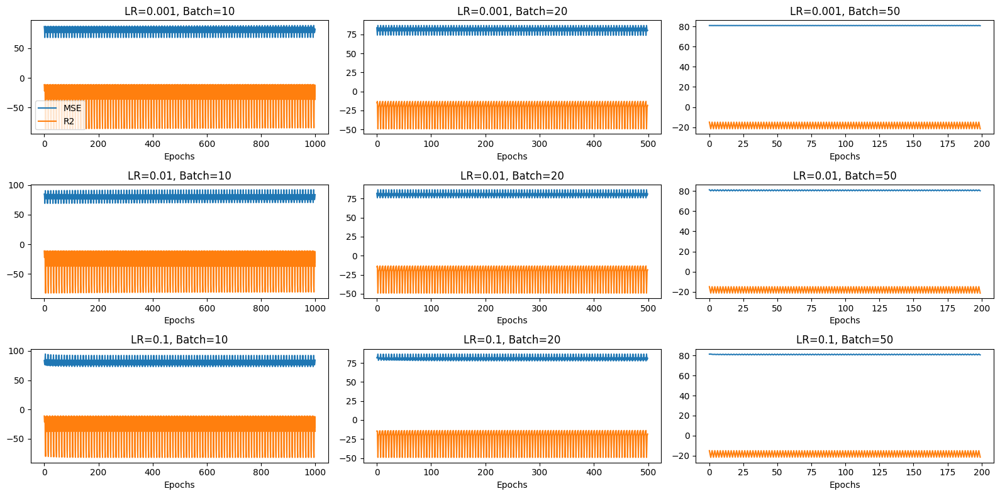

In [21]:
#Momentum added to SGD OLS RMSProp:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Normalize the input data
X_mean = np.mean(X, axis=0)
X_std = np.std(X, axis=0)
X_normalized = (X - X_mean) / X_std

# Ensure the same normalization is applied to test data if needed
# X_test_normalized = (X_test - X_mean) / X_std

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rates = [0.001, 0.01, 0.1]
batch_sizes = [10, 20, 50]

# Lists to store the MSE and R2 values for different settings
results = {
    "learning_rates": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        # RMSProp settings
        epsilon = 1e-8
        decay_rate = 0.9  # RMSProp decay rate
        squared_gradients = jnp.zeros_like(params)

        for epoch in range(n_epochs):
            n_iterations = len(X_normalized) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X_normalized[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(mean_squared_error_jax)(params, X_batch, y_batch)

                # Calculate the squared gradients
                squared_gradients = decay_rate * squared_gradients + (1 - decay_rate) * jnp.square(gradients)

                # Calculate the update with RMSProp
                adjusted_learning_rate = learning_rate / (jnp.sqrt(squared_gradients) + epsilon)
                params -= adjusted_learning_rate * gradients

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["learning_rates"].append(learning_rate)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the results for different settings
plt.figure(figsize=(16, 8))
for i in range(len(learning_rates)):
    for j in range(len(batch_sizes)):
        label = f"LR={learning_rates[i]}, Batch={batch_sizes[j]}"
        plt.subplot(len(learning_rates), len(batch_sizes), i * len(batch_sizes) + j + 1)
        plt.plot(results["mse_values"][i * len(batch_sizes) + j], label="MSE")
        plt.plot(results["r2_values"][i * len(batch_sizes) + j], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0 and j == 0:
            plt.legend()

plt.tight_layout()
plt.show()

Learned parameters: [3.0840468 2.7641375]


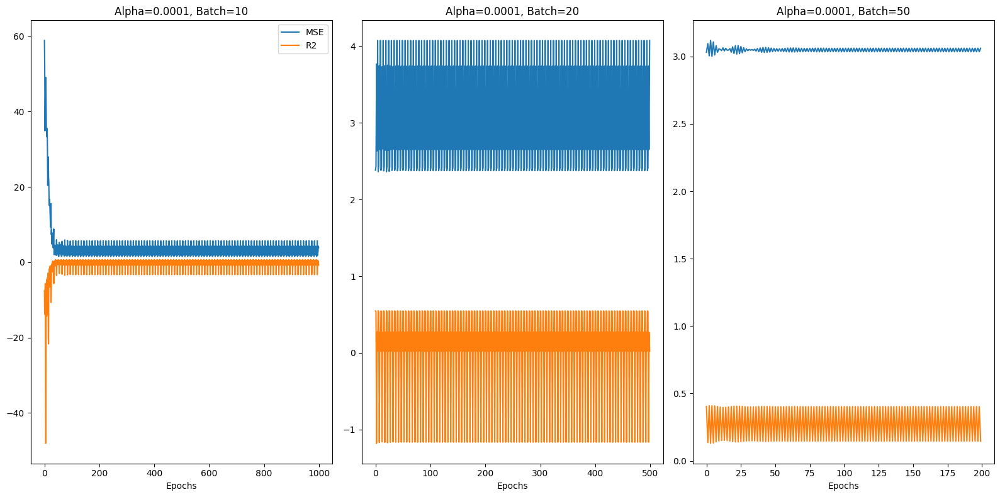

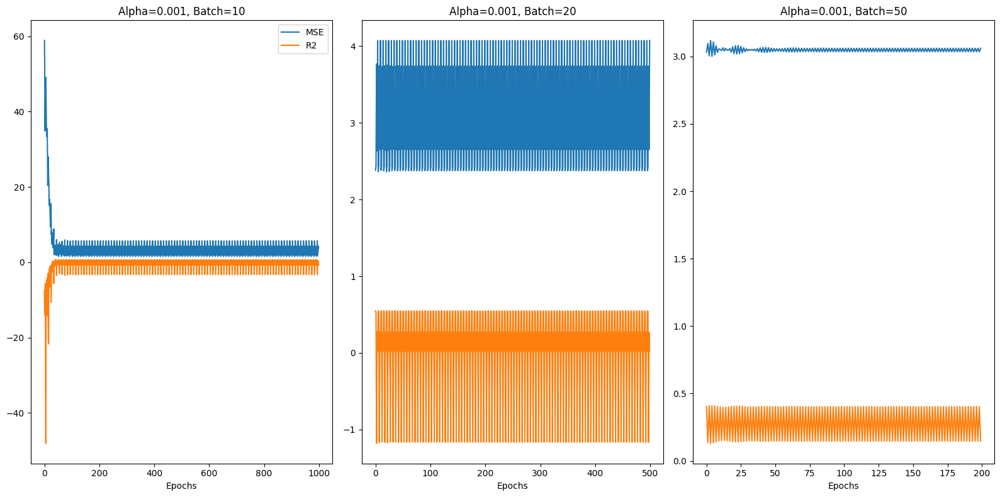

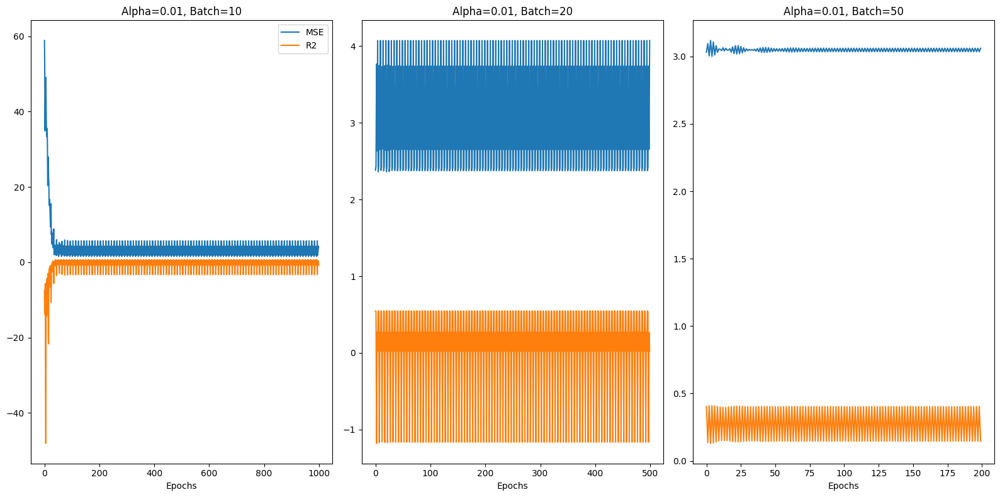

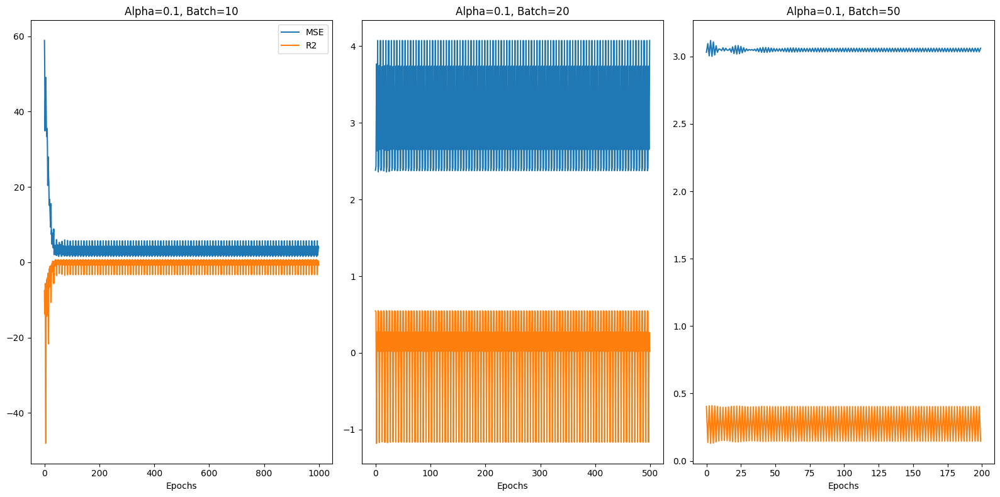

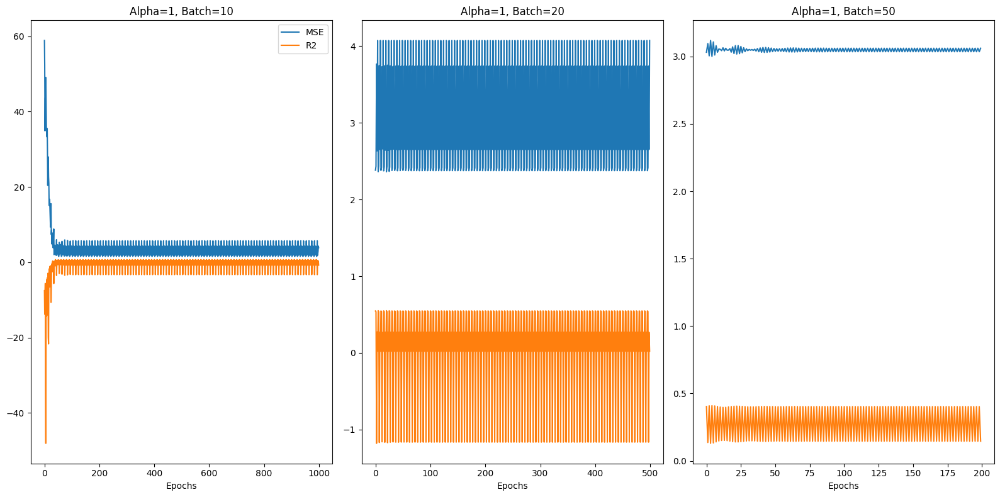

In [22]:
#Adding momentum to SGD, RMSProp Ridge JAX: 
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error with L2 regularization)
def mean_squared_error_jax(params, x, y, alpha):
    predictions = linear_regression(params, x)
    mse = jnp.mean((predictions - y) ** 2)
    penalty = alpha * jnp.sum(params**2)  # L2 regularization
    return mse + penalty

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rate = 0.01  # Fixed learning rate
batch_sizes = [10, 20, 50]  # Batch sizes
alphas = [0.0001, 0.001, 0.01, 0.1, 1]  # Lambda values

# Lists to store the MSE and R2 values for different settings
results = {
    "alphas": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for alpha in alphas:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        # Initialize squared gradient accumulator for RMSProp
        squared_grad_accumulator = jnp.zeros(params.shape)

        # Initialize momentum term
        momentum = 0.9
        velocity = jnp.zeros(params.shape)

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(lambda params: mean_squared_error_jax(params, X_batch, y_batch, alpha))(params)

                # Update squared gradient accumulator
                squared_grad_accumulator = squared_grad_accumulator * momentum + (1 - momentum) * gradients ** 2

                # Calculate the adaptive learning rate for RMSProp
                adjusted_learning_rate = learning_rate / (jnp.sqrt(squared_grad_accumulator) + 1e-8)

                # Update parameters with momentum
                velocity = momentum * velocity - adjusted_learning_rate * gradients
                params += velocity

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["alphas"].append(alpha)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Create plots for different alpha and batch size values
for alpha in alphas:
    plt.figure(figsize=(16, 8))
    for batch_size in batch_sizes:
        i = batch_sizes.index(batch_size)
        label = f"Alpha={alpha}, Batch={batch_size}"
        plt.subplot(1, len(batch_sizes), i + 1)
        plt.plot(results["mse_values"][i], label="MSE")
        plt.plot(results["r2_values"][i], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0:
            plt.legend()
    plt.tight_layout()
    plt.show()

Learned parameters: [1.5720757 1.1534076]


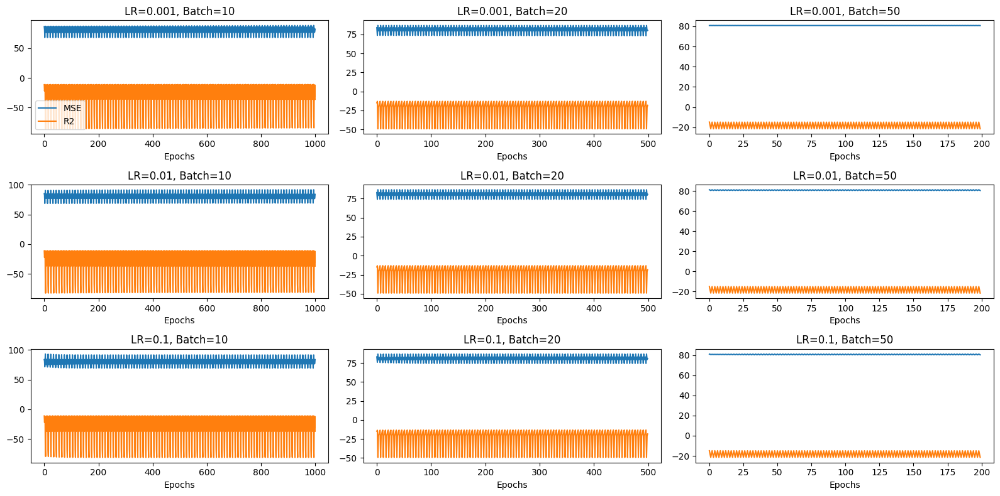

In [23]:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Normalize the input data
X_mean = np.mean(X, axis=0)
X_std = np.std(X, axis=0)
X_normalized = (X - X_mean) / X_std

# Ensure the same normalization is applied to test data if needed
# X_test_normalized = (X_test - X_mean) / X_std

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error)
def mean_squared_error_jax(params, x, y):
    predictions = linear_regression(params, x)
    return jnp.mean((predictions - y) ** 2)

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rates = [0.001, 0.01, 0.1]
batch_sizes = [10, 20, 50]

# Lists to store the MSE and R2 values for different settings
results = {
    "learning_rates": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for learning_rate in learning_rates:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        # Adam optimizer settings
        beta1 = 0.9
        beta2 = 0.999
        epsilon = 1e-8
        m = jnp.zeros_like(params)
        v = jnp.zeros_like(params)
        t = 0

        for epoch in range(n_epochs):
            n_iterations = len(X_normalized) // batch_size
            for iteration in range(n_iterations):
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X_normalized[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                t += 1  # Increment the timestep

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(mean_squared_error_jax)(params, X_batch, y_batch)

                m = beta1 * m + (1 - beta1) * gradients
                v = beta2 * v + (1 - beta2) * gradients ** 2

                m_hat = m / (1 - beta1 ** t)
                v_hat = v / (1 - beta2 ** t)

                # Calculate the update with the Adam optimizer
                params -= learning_rate * m_hat / (jnp.sqrt(v_hat) + epsilon)

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["learning_rates"].append(learning_rate)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Plot the results for different settings
plt.figure(figsize=(16, 8))
for i in range(len(learning_rates)):
    for j in range(len(batch_sizes)):
        label = f"LR={learning_rates[i]}, Batch={batch_sizes[j]}"
        plt.subplot(len(learning_rates), len(batch_sizes), i * len(batch_sizes) + j + 1)
        plt.plot(results["mse_values"][i * len(batch_sizes) + j], label="MSE")
        plt.plot(results["r2_values"][i * len(batch_sizes) + j], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0 and j == 0:
            plt.legend()

plt.tight_layout()
plt.show()

Learned parameters: [3.0864873 2.761633 ]


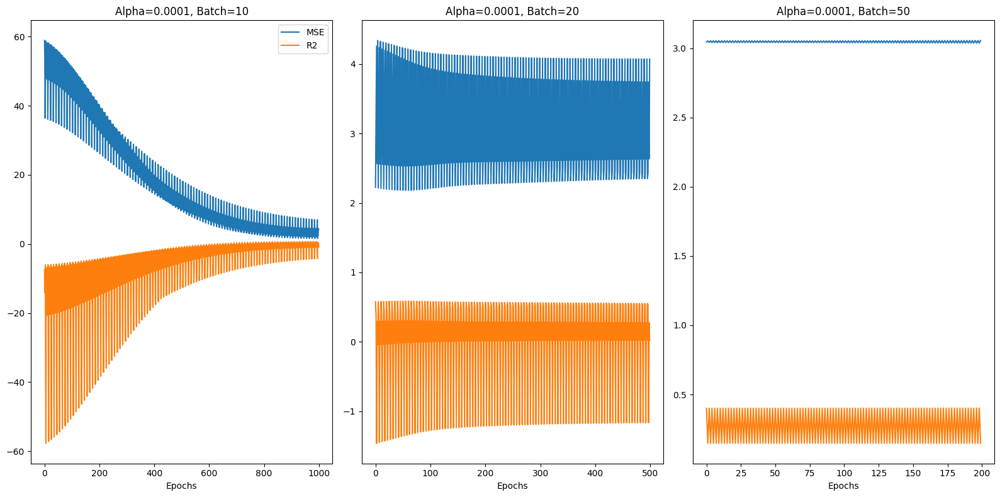

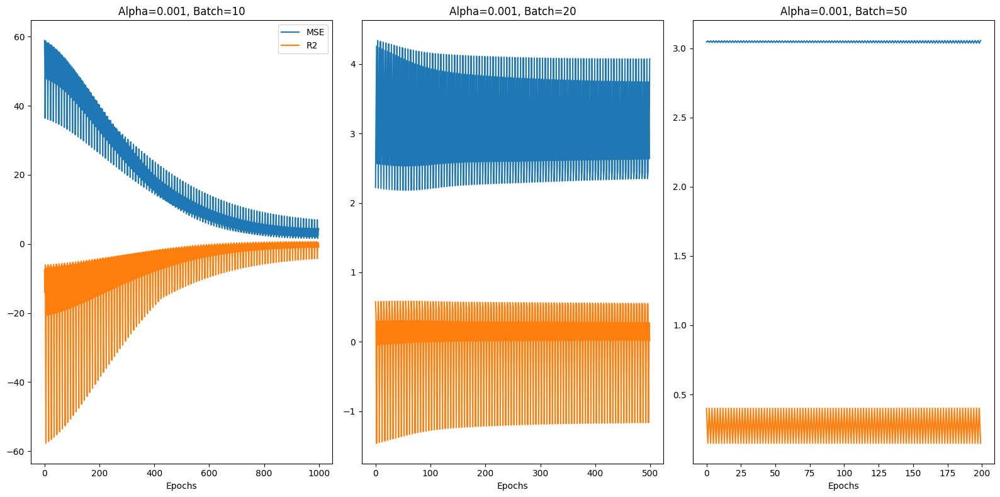

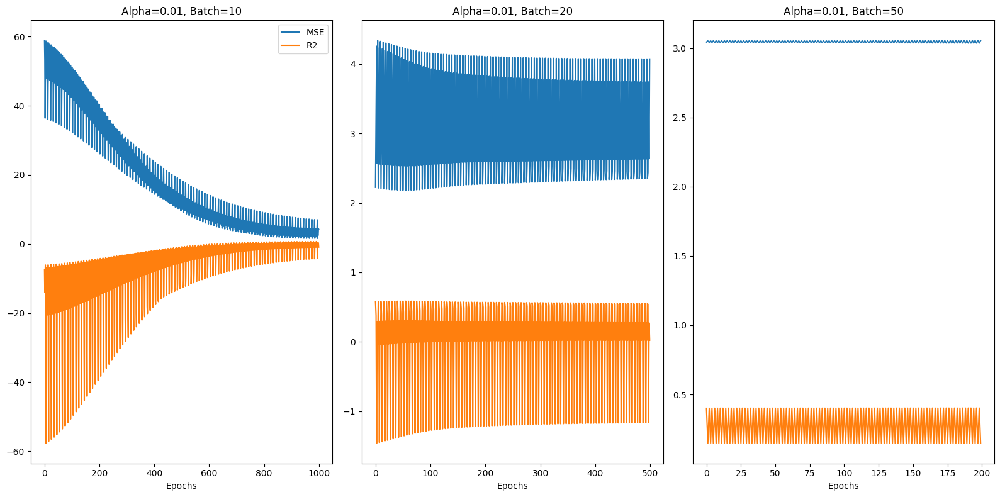

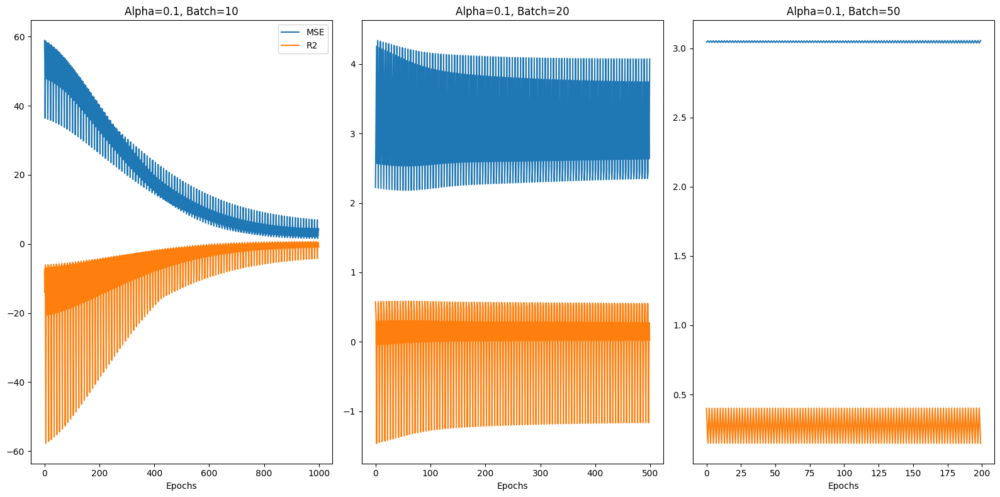

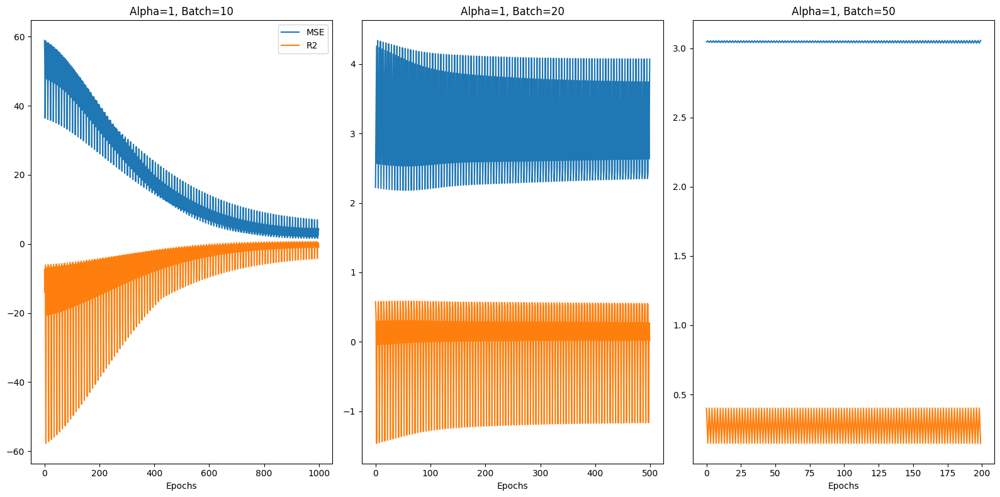

In [24]:
#Ridge ADAM JAX:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error with L2 regularization)
def mean_squared_error_jax(params, x, y, alpha):
    predictions = linear_regression(params, x)
    mse = jnp.mean((predictions - y) ** 2)
    penalty = alpha * jnp.sum(params**2)  # L2 regularization
    return mse + penalty

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rate = 0.01  # Fixed learning rate
batch_sizes = [10, 20, 50]  # Batch sizes
alphas = [0.0001, 0.001, 0.01, 0.1, 1]  # Lambda values

# Lists to store the MSE and R2 values for different settings
results = {
    "alphas": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for alpha in alphas:
    for batch_size in batch_sizes:
        # Lists to store the MSE and R2 values
        mse_list = []
        r2_list = []

        # Initialize Adam parameters
        beta1 = 0.9  # Exponential decay rates for the moment estimates
        beta2 = 0.999
        epsilon = 1e-8
        m = jnp.zeros(params.shape)  # First moment estimate
        v = jnp.zeros(params.shape)  # Second moment estimate
        t = 0  # Time step

        for epoch in range(n_epochs):
            n_iterations = len(X) // batch_size
            for iteration in range(n_iterations):
                t += 1
                # Create minibatches
                start_idx = iteration * batch_size
                end_idx = (iteration + 1) * batch_size
                X_batch = X[start_idx:end_idx]
                y_batch = y[start_idx:end_idx]

                y_pred = jnp.dot(X_batch, params)
                error = y_pred - y_batch

                # Compute the gradient using JAX automatic differentiation
                gradients = jax.grad(lambda params: mean_squared_error_jax(params, X_batch, y_batch, alpha))(params)

                # Update first moment estimate
                m = beta1 * m + (1 - beta1) * gradients
                # Update second moment estimate
                v = beta2 * v + (1 - beta2) * gradients**2

                # Bias-corrected first and second moment estimates
                m_hat = m / (1 - beta1**t)
                v_hat = v / (1 - beta2**t)

                # Update parameters with Adam
                learning_rate_t = learning_rate * jnp.sqrt(1 - beta2**t) / (1 - beta1**t)
                params -= learning_rate_t * m_hat / (jnp.sqrt(v_hat) + epsilon)

                # Calculate MSE and R2 during training
                mse = mean_squared_error(y_batch, y_pred)
                r2 = r2_score(y_batch, y_pred)
                mse_list.append(mse)
                r2_list.append(r2)

        results["alphas"].append(alpha)
        results["batch_sizes"].append(batch_size)
        results["mse_values"].append(mse_list)
        results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Create plots for different alpha and batch size values
for alpha in alphas:
    plt.figure(figsize=(16, 8))
    for batch_size in batch_sizes:
        i = batch_sizes.index(batch_size)
        label = f"Alpha={alpha}, Batch={batch_size}"
        plt.subplot(1, len(batch_sizes), i + 1)
        plt.plot(results["mse_values"][i], label="MSE")
        plt.plot(results["r2_values"][i], label="R2")
        plt.xlabel('Epochs')
        plt.title(label)
        if i == 0:
            plt.legend()
    plt.tight_layout()
    plt.show()

Learned parameters: [3.085506 2.762637]


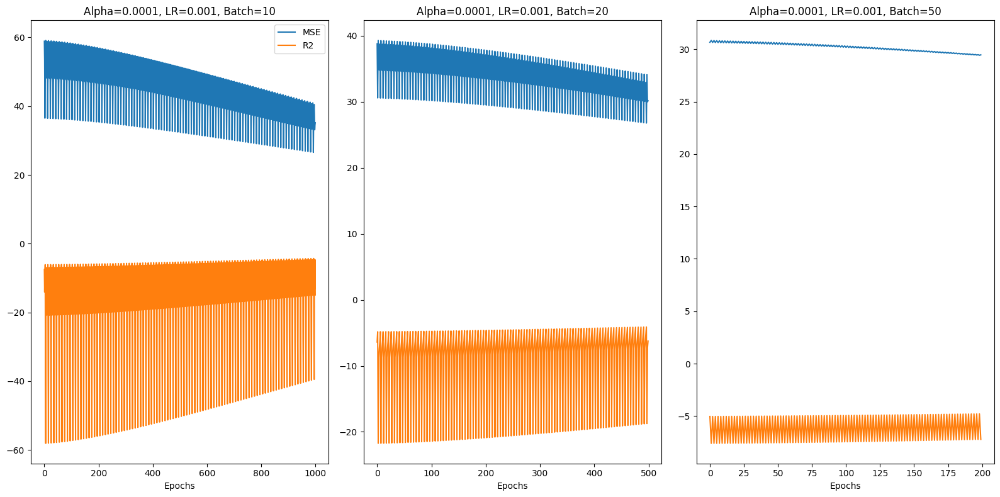

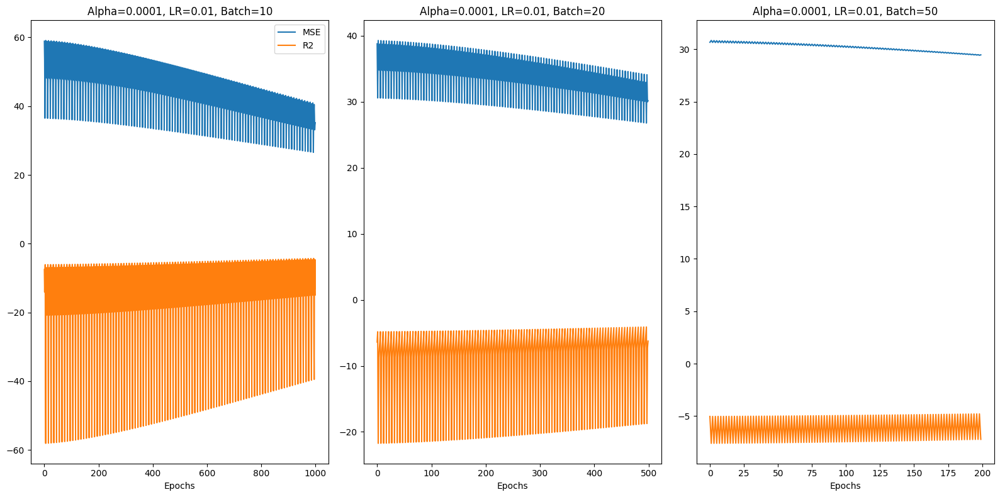

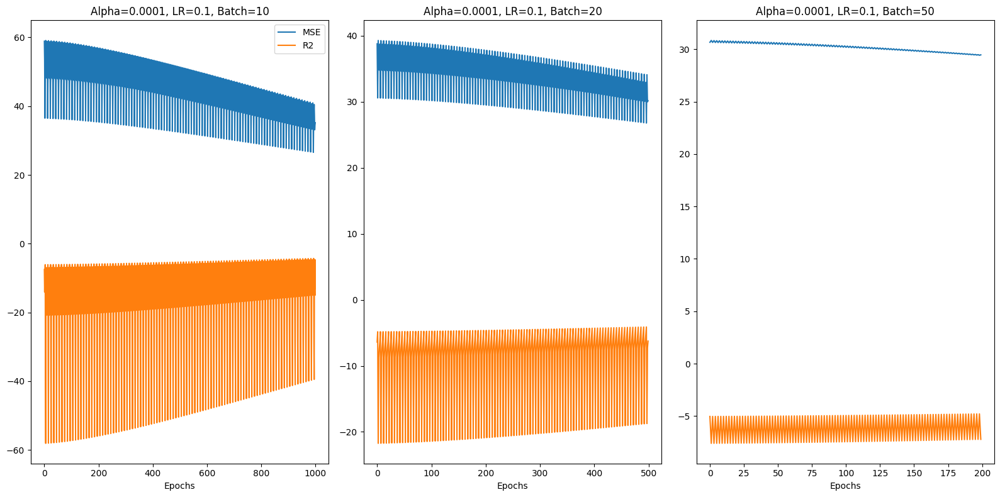

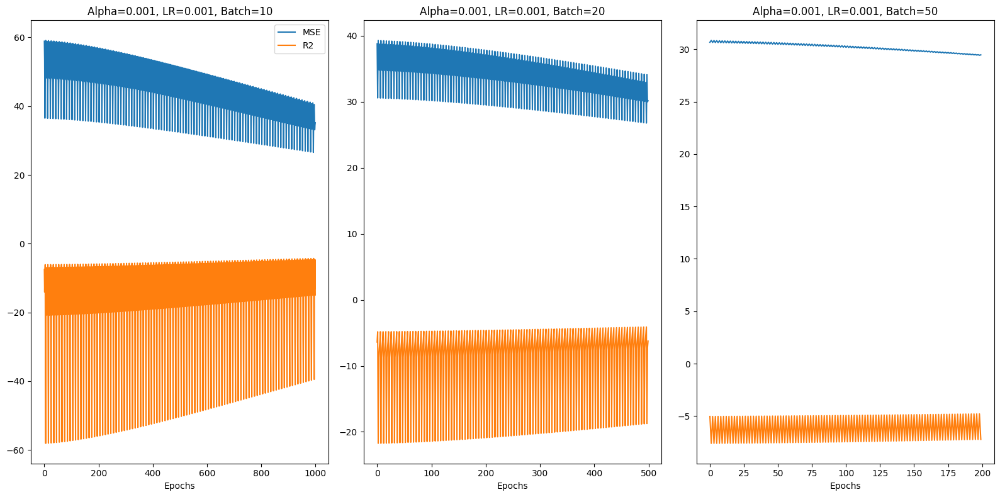

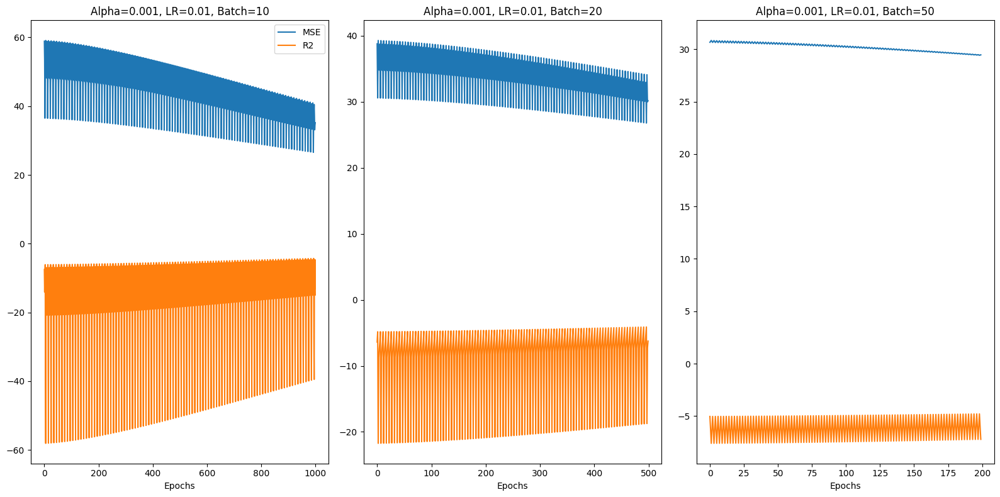

...

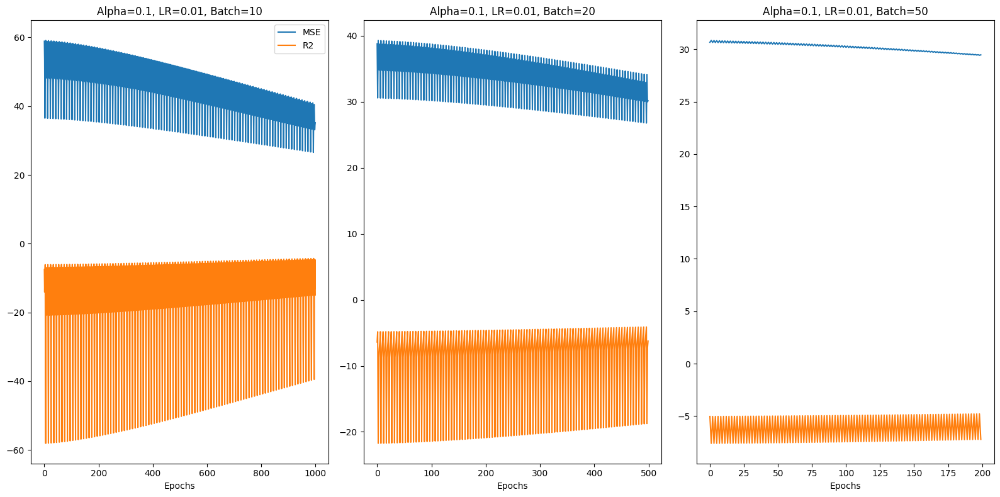

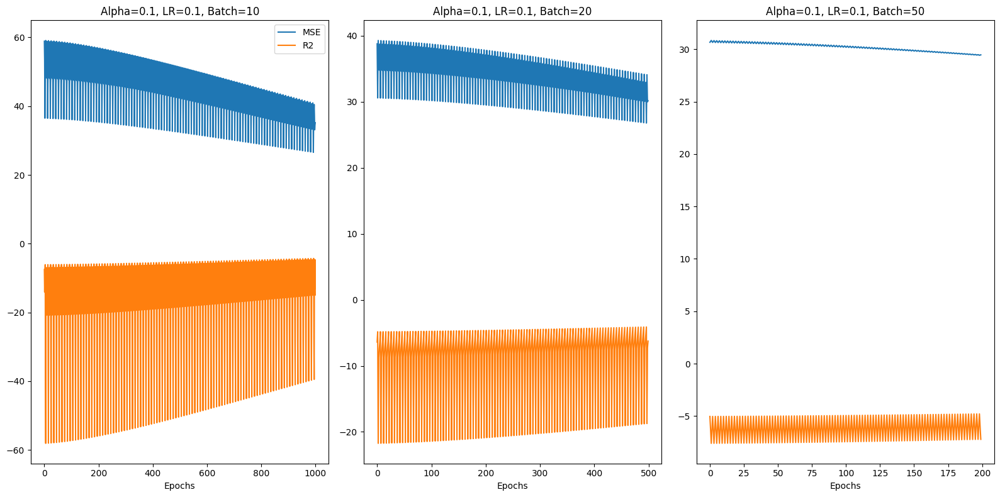

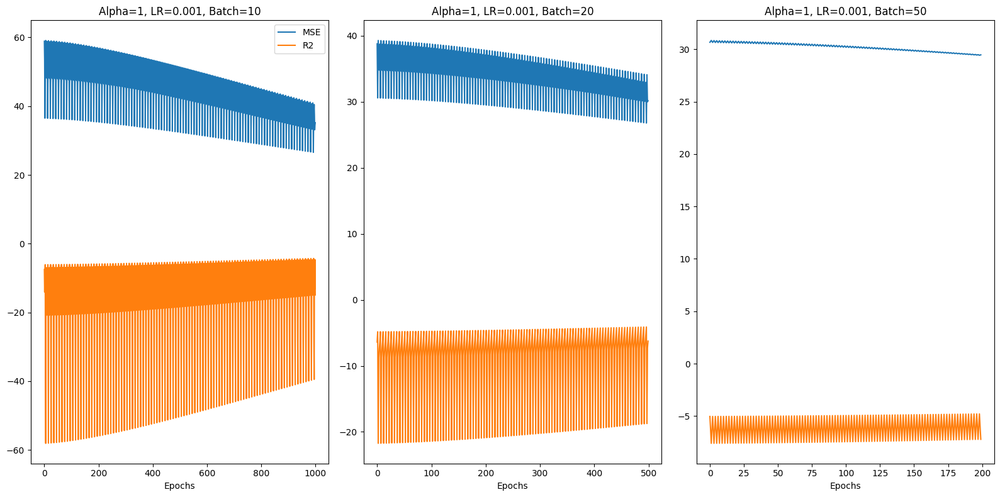

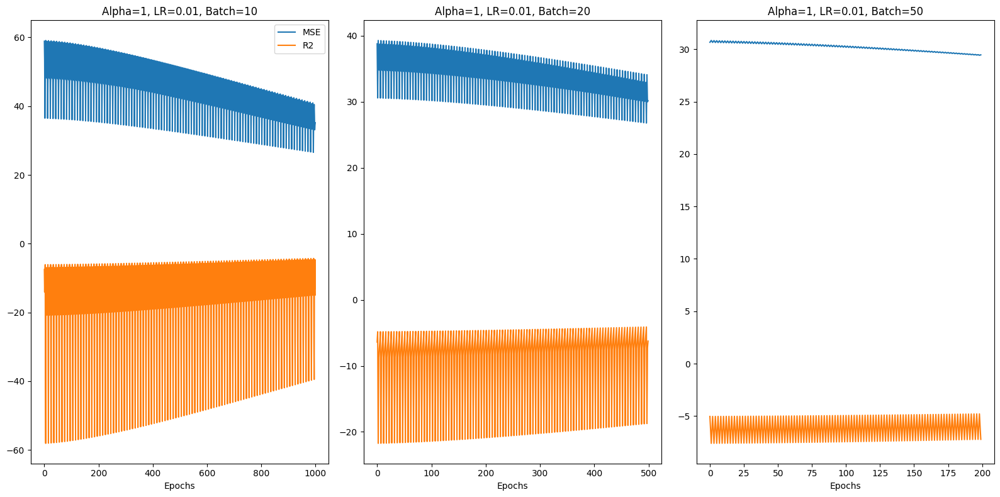

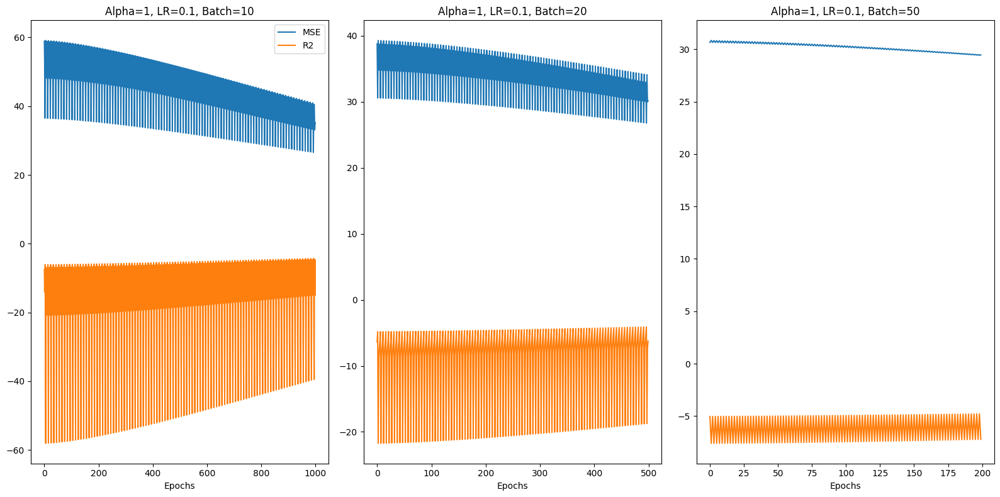

In [25]:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Generate some sample data
np.random.seed(0)
X = 2 * np.random.rand(100, 2)
y = 4 + np.dot(X, np.array([3, 2])) + np.random.randn(100)

# Define the model
def linear_regression(params, x):
    return jnp.dot(x, params)

# Define the loss function (mean squared error with L2 regularization)
def mean_squared_error_jax(params, x, y, alpha):
    predictions = linear_regression(params, x)
    mse = jnp.mean((predictions - y) ** 2)
    penalty = alpha * jnp.sum(params**2)  # L2 regularization
    return mse + penalty

# Initialize model parameters
params = jnp.array([1.0, 1.0])

# Training settings
n_epochs = 100
learning_rates = [0.001, 0.01, 0.1]  # Learning rates
batch_sizes = [10, 20, 50]  # Batch sizes
alphas = [0.0001, 0.001, 0.01, 0.1, 1]  # Lambda values

# Lists to store the MSE and R2 values for different settings
results = {
    "alphas": [],
    "learning_rates": [],
    "batch_sizes": [],
    "mse_values": [],
    "r2_values": []
}

for lr in learning_rates:
    for alpha in alphas:
        for batch_size in batch_sizes:
            # Lists to store the MSE and R2 values
            mse_list = []
            r2_list = []

            # Initialize Adam parameters
            beta1 = 0.9  # Exponential decay rates for the moment estimates
            beta2 = 0.999
            epsilon = 1e-8
            m = jnp.zeros(params.shape)  # First moment estimate
            v = jnp.zeros(params.shape)  # Second moment estimate
            t = 0  # Time step

            for epoch in range(n_epochs):
                n_iterations = len(X) // batch_size
                for iteration in range(n_iterations):
                    t += 1
                    # Create minibatches
                    start_idx = iteration * batch_size
                    end_idx = (iteration + 1) * batch_size
                    X_batch = X[start_idx:end_idx]
                    y_batch = y[start_idx:end_idx]

                    y_pred = jnp.dot(X_batch, params)
                    error = y_pred - y_batch

                    # Compute the gradient using JAX automatic differentiation
                    gradients = jax.grad(lambda params: mean_squared_error_jax(params, X_batch, y_batch, alpha))(params)

                    # Update first moment estimate
                    m = beta1 * m + (1 - beta1) * gradients
                    # Update second moment estimate
                    v = beta2 * v + (1 - beta2) * gradients**2

                    # Bias-corrected first and second moment estimates
                    m_hat = m / (1 - beta1**t)
                    v_hat = v / (1 - beta2**t)

                    # Update parameters with Adam
                    learning_rate_t = lr * jnp.sqrt(1 - beta2**t) / (1 - beta1**t)
                    params -= learning_rate_t * m_hat / (jnp.sqrt(v_hat) + epsilon)

                    # Calculate MSE and R2 during training
                    mse = mean_squared_error(y_batch, y_pred)
                    r2 = r2_score(y_batch, y_pred)
                    mse_list.append(mse)
                    r2_list.append(r2)

            results["alphas"].append(alpha)
            results["learning_rates"].append(lr)
            results["batch_sizes"].append(batch_size)
            results["mse_values"].append(mse_list)
            results["r2_values"].append(r2_list)

# Print the learned parameters
print("Learned parameters:", params)

# Create plots for different alpha, learning rate, and batch size values
for alpha in alphas:
    for lr in learning_rates:
        plt.figure(figsize=(16, 8))
        for batch_size in batch_sizes:
            i = batch_sizes.index(batch_size)
            label = f"Alpha={alpha}, LR={lr}, Batch={batch_size}"
            plt.subplot(1, len(batch_sizes), i + 1)
            plt.plot(results["mse_values"][i], label="MSE")
            plt.plot(results["r2_values"][i], label="R2")
            plt.xlabel('Epochs')
            plt.title(label)
            if i == 0:
                plt.legend()
        plt.tight_layout()
        plt.show()